In [22]:
import os
os.chdir('mmpose')

In [15]:
!python tools/misc/publish_model.py \
        work_dirs/rtmpose-m-Dog_hip_all_real_world/best_PCK_epoch_10.pth \
        checkpoint/real_world_epoch_10.pth

09/17 07:14:33 - mmengine - INFO - Key `message_hub` will be removed because it is not in save_keys. If you want to keep it, please set --save-keys.
09/17 07:14:33 - mmengine - INFO - Key `ema_state_dict` will be removed because it is not in save_keys. If you want to keep it, please set --save-keys.


In [3]:
!python tools/misc/publish_model.py \
        work_dirs/rtmpose-l-Dog_hip_all/epoch_200.pth \
        checkpoint/all_best_PCK_epoch_200.pth

07/21 04:36:17 - mmengine - INFO - Key `message_hub` will be removed because it is not in save_keys. If you want to keep it, please set --save-keys.
07/21 04:36:17 - mmengine - INFO - Key `optimizer` will be removed because it is not in save_keys. If you want to keep it, please set --save-keys.
07/21 04:36:17 - mmengine - INFO - Key `param_schedulers` will be removed because it is not in save_keys. If you want to keep it, please set --save-keys.
07/21 04:36:17 - mmengine - INFO - Key `ema_state_dict` will be removed because it is not in save_keys. If you want to keep it, please set --save-keys.


In [1]:
import cv2
import numpy as np
from PIL import Image

import matplotlib.pyplot as plt
%matplotlib inline
import scipy
import pandas as pd

import torch

import mmcv
from mmcv import imread
import mmengine
from mmengine.registry import init_default_scope

from mmpose.apis import inference_topdown
from mmpose.apis import init_model as init_pose_estimator
from mmpose.evaluation.functional import nms
from mmpose.registry import VISUALIZERS
from mmpose.structures import merge_data_samples
import matplotlib.patches as patches

from mmdet.apis import inference_detector, init_detector



In [2]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print('device', device)

device cuda:0


In [3]:
# rtmdet
detector = init_detector(
    '/home/featurize/work/mmdetection/data/rtmdet_m_dog_hip_all.py',
    
    '/home/featurize/work/mmdetection/checkpoint/rtmdet_dog_hip_realworld_181-48c67b5c.pth',
    device=device
)

Loads checkpoint by local backend from path: /home/featurize/work/mmdetection/checkpoint/rtmdet_dog_hip_realworld_181-48c67b5c.pth


In [4]:
img_path = '/home/featurize/work/Dataset2/data/July_2024/138477.jpg'
init_default_scope(detector.cfg.get('default_scope', 'mmdet'))

detect_result = inference_detector(detector, img_path)

/environment/miniconda3/lib/python3.7/site-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [5]:
detect_result.keys()

['ignored_instances', 'pred_instances', 'gt_instances']

In [6]:
labels =detect_result.pred_instances.labels
labels

tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1,
        0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1,
        0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1,
        0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0,
        1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1,
        0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
        1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0,
        1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0,
        1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0,
        1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1,
        0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1,
        1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1,

In [7]:
print(dir(detect_result.pred_instances))

['__class__', '__contains__', '__delattr__', '__delitem__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__getitem__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__len__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__setitem__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', '_data_fields', '_metainfo_fields', 'all_items', 'all_keys', 'all_values', 'bboxes', 'cat', 'clone', 'cpu', 'cuda', 'detach', 'get', 'items', 'keys', 'labels', 'metainfo', 'metainfo_items', 'metainfo_keys', 'metainfo_values', 'mlu', 'musa', 'new', 'npu', 'numpy', 'pop', 'scores', 'set_data', 'set_field', 'set_metainfo', 'to', 'to_dict', 'to_tensor', 'update', 'values']


In [8]:
scores = detect_result.pred_instances.scores
scores 

tensor([0.8846, 0.8744, 0.7639, 0.6826, 0.2474, 0.2324, 0.1903, 0.1371, 0.1145,
        0.1072, 0.0815, 0.0742, 0.0555, 0.0541, 0.0497, 0.0447, 0.0429, 0.0420,
        0.0368, 0.0368, 0.0350, 0.0347, 0.0336, 0.0322, 0.0312, 0.0312, 0.0305,
        0.0290, 0.0281, 0.0277, 0.0273, 0.0263, 0.0260, 0.0250, 0.0250, 0.0245,
        0.0239, 0.0239, 0.0228, 0.0228, 0.0226, 0.0226, 0.0223, 0.0223, 0.0221,
        0.0219, 0.0219, 0.0216, 0.0214, 0.0213, 0.0213, 0.0210, 0.0210, 0.0209,
        0.0208, 0.0203, 0.0203, 0.0202, 0.0201, 0.0201, 0.0199, 0.0199, 0.0198,
        0.0198, 0.0198, 0.0195, 0.0195, 0.0195, 0.0194, 0.0194, 0.0191, 0.0191,
        0.0190, 0.0187, 0.0185, 0.0185, 0.0185, 0.0184, 0.0183, 0.0183, 0.0183,
        0.0182, 0.0181, 0.0181, 0.0181, 0.0180, 0.0177, 0.0177, 0.0177, 0.0175,
        0.0175, 0.0175, 0.0175, 0.0174, 0.0173, 0.0171, 0.0171, 0.0171, 0.0171,
        0.0170, 0.0170, 0.0169, 0.0169, 0.0169, 0.0167, 0.0167, 0.0167, 0.0166,
        0.0166, 0.0166, 0.0166, 0.0165, 

In [9]:
bboxes=detect_result.pred_instances.bboxes[:]
bboxes

tensor([[ 201.6828,  118.3081,  311.9575,  228.3874],
        [ 670.9369,  103.9759,  776.3227,  209.1609],
        [ 691.9941,   47.6208,  795.4813,  151.5668],
        ...,
        [ 270.4961,  205.6019,  326.1867,  264.2582],
        [ 949.0539,  219.6707, 1001.7145,  285.7639],
        [ 964.4389,   52.2294, 1007.0000,  159.0862]], device='cuda:0')

In [10]:
pose_estimator = init_pose_estimator(
    '/home/featurize/work/mmpose/data/rtmpose-m-Dog_hip_all.py',
    '/home/featurize/work/mmpose/checkpoint/real_world_epoch_10-8d1d3c5b_20240917.pth',
    device=device,
    cfg_options={'model': {'test_cfg': {'output_heatmaps': False}}}
)

Loads checkpoint by local backend from path: /home/featurize/work/mmpose/checkpoint/real_world_epoch_10-8d1d3c5b_20240917.pth


In [11]:
img_path = '/home/featurize/work/Dataset2/data/July_2024/138477.jpg'

In [12]:
init_default_scope(detector.cfg.get('default_scope', 'mmdet'))

09/17 07:37:19 - mmengine - WARNING - The current default scope "mmpose" is not "mmdet", `init_default_scope` will force set the currentdefault scope to "mmdet".


In [13]:
detect_result = inference_detector(detector, img_path)

In [14]:
detect_result.keys()

['ignored_instances', 'pred_instances', 'gt_instances']

Processing /home/featurize/work/Dataset2/data/Testing/Images/340563.jpeg
09/17 07:15:07 - mmengine - WARNING - The current default scope "mmdet" is not "mmpose", `init_default_scope` will force set the currentdefault scope to "mmpose".
head: [[[518 138]]

 [[242 109]]]
center: [[[525 166]]

 [[221 130]]]


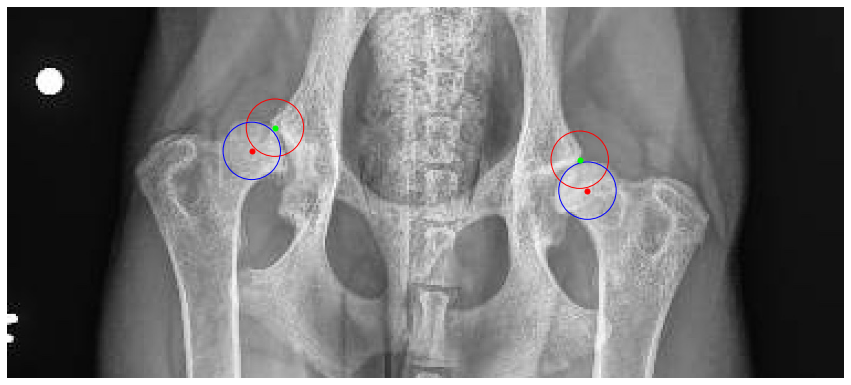

Processing /home/featurize/work/Dataset2/data/Testing/Images/359971.jpeg
head: [[[457 112]]

 [[179 106]]]
center: [[[480 106]]

 [[164  92]]]


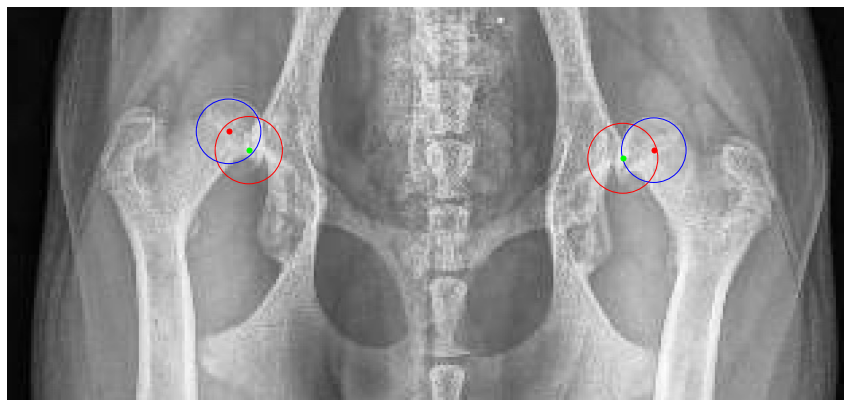

Processing /home/featurize/work/Dataset2/data/Testing/Images/328949.jpeg
head: [[[340 140]]

 [[685 153]]]
center: [[[694 192]]

 [[318 171]]]


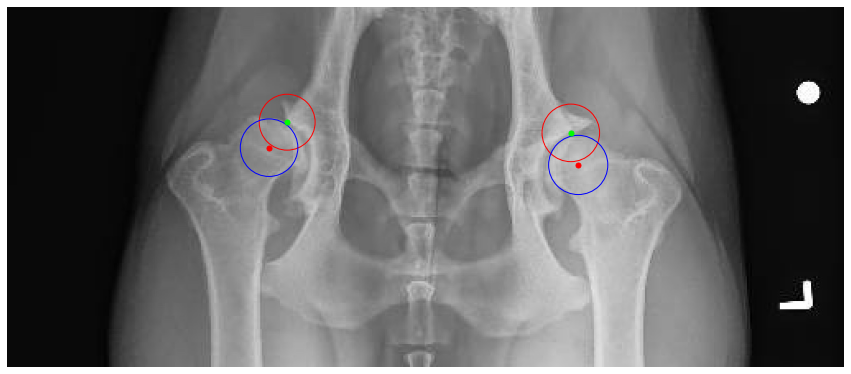

Processing /home/featurize/work/Dataset2/data/Testing/Images/348742.jpeg
head: [[[447 124]]

 [[196 113]]]
center: [[[436 153]]

 [[202 142]]]


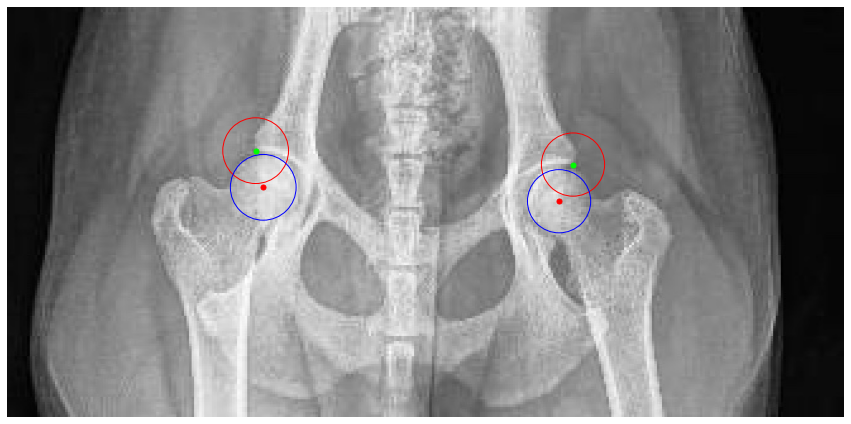

Processing /home/featurize/work/Dataset2/data/Testing/Images/355767.jpeg
head: [[[616 120]]

 [[286 111]]]
center: [[[294 150]]

 [[603 158]]]


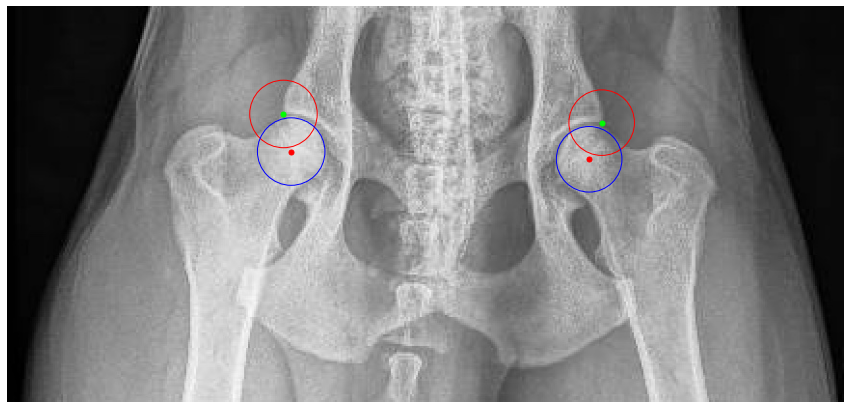

Processing /home/featurize/work/Dataset2/data/Testing/Images/353517.jpeg
head: [[[453  87]]

 [[182  97]]]
center: [[[191 126]]

 [[451 118]]]


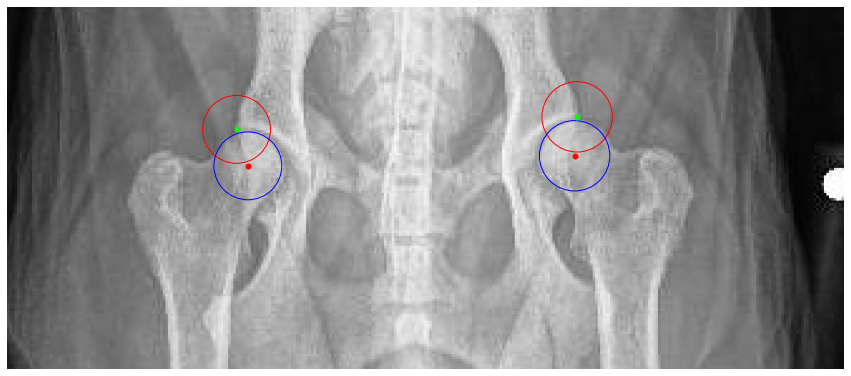

Processing /home/featurize/work/Dataset2/data/Testing/Images/355524.jpeg
head: [[[478 116]]

 [[181 115]]]
center: [[[484 152]]

 [[171 150]]]


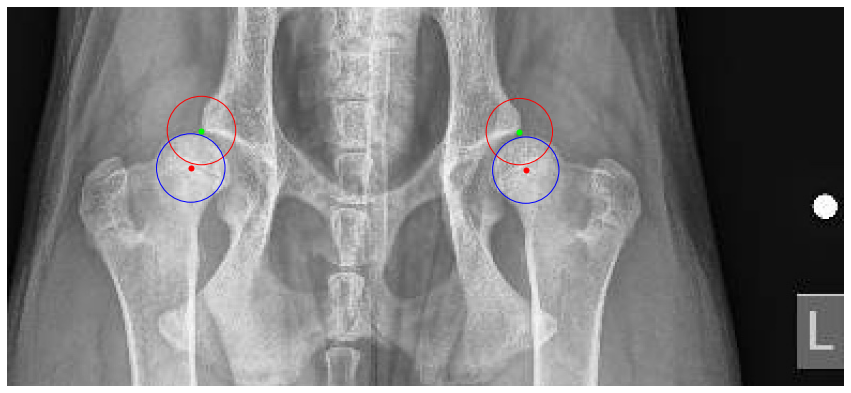

Processing /home/featurize/work/Dataset2/data/Testing/Images/358587.jpeg
head: [[[405  62]]

 [[171  71]]]
center: [[[398  87]]

 [[178  95]]]


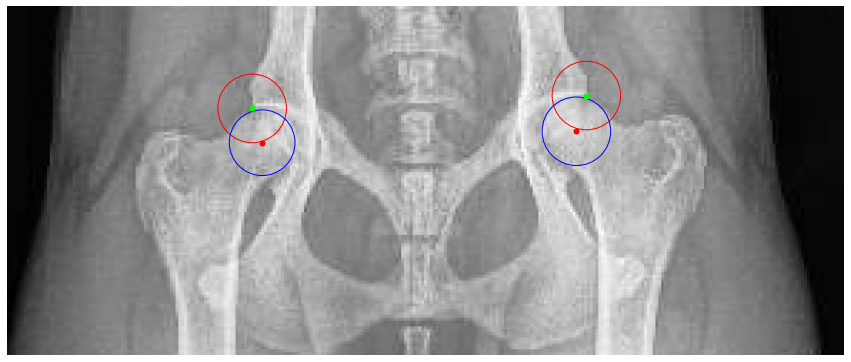

Processing /home/featurize/work/Dataset2/data/Testing/Images/355223.jpeg
head: [[[621 121]]

 [[364 119]]]
center: [[[372 145]]

 [[614 146]]]


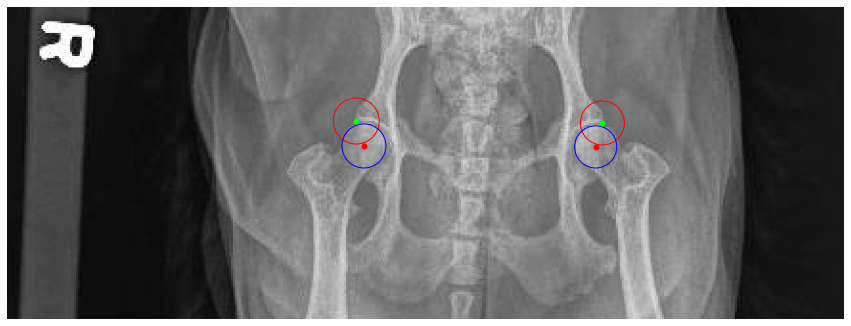

Processing /home/featurize/work/Dataset2/data/Testing/Images/264113.jpeg
head: [[[594 103]]

 [[301  77]]]
center: [[[580 135]]

 [[302 112]]]


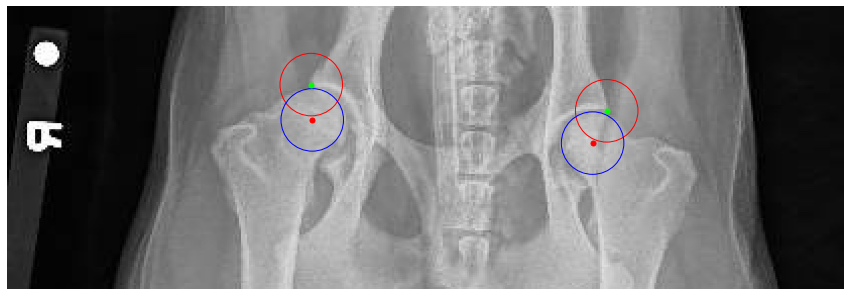

Processing /home/featurize/work/Dataset2/data/Testing/Images/365780.jpeg
head: [[[591 137]]

 [[209 118]]]
center: [[[568 182]]

 [[225 164]]]


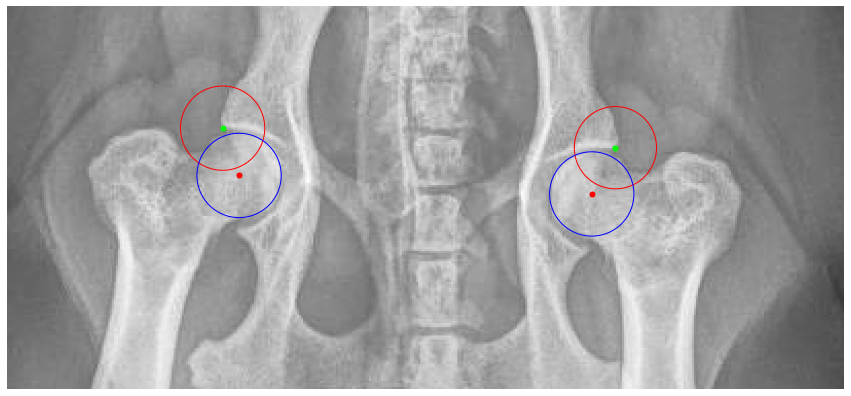

Processing /home/featurize/work/Dataset2/data/Testing/Images/360388.jpeg
head: [[[147  58]]

 [[448  83]]]
center: [[[153  94]]

 [[433 115]]]


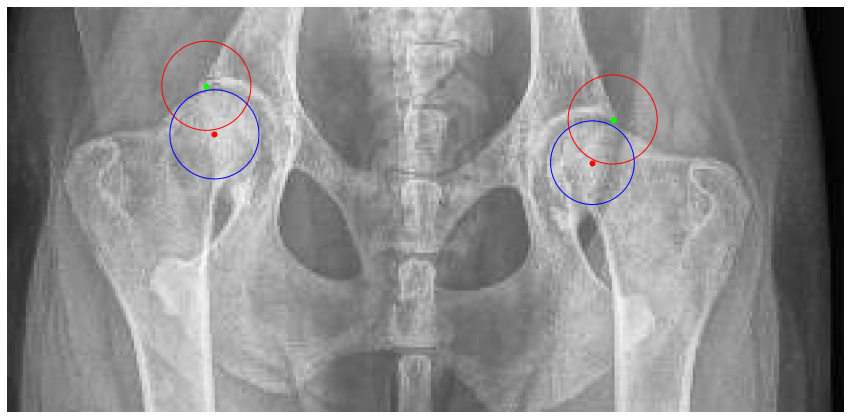

Processing /home/featurize/work/Dataset2/data/Testing/Images/246775.jpeg
head: [[[283  34]]

 [[120  33]]]
center: [[[126  50]]

 [[277  51]]]


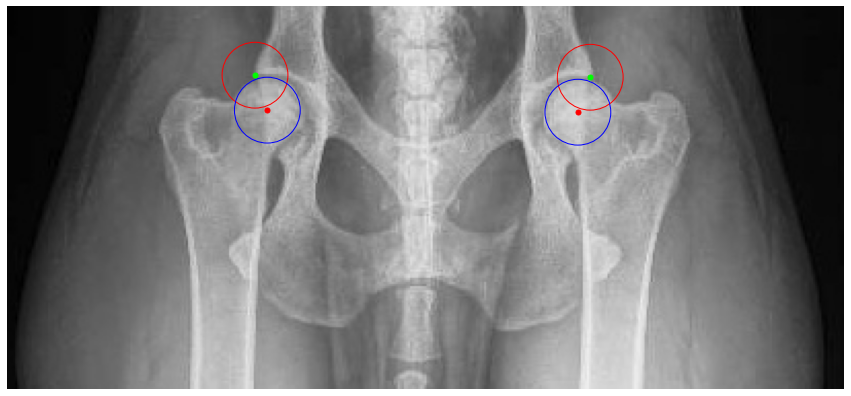

Processing /home/featurize/work/Dataset2/data/Testing/Images/361492.jpeg
head: [[[176  76]]

 [[499  70]]]
center: [[[496 104]]

 [[178 111]]]


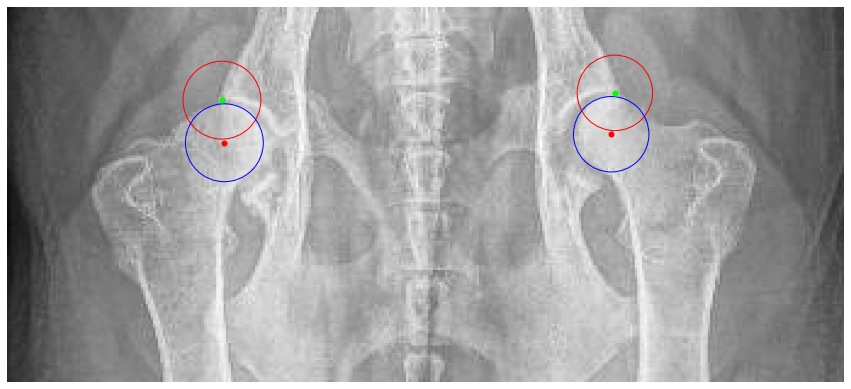

Processing /home/featurize/work/Dataset2/data/Testing/Images/336938.jpeg
head: [[[486 143]]

 [[221 127]]]
center: [[[226 158]]

 [[477 173]]]


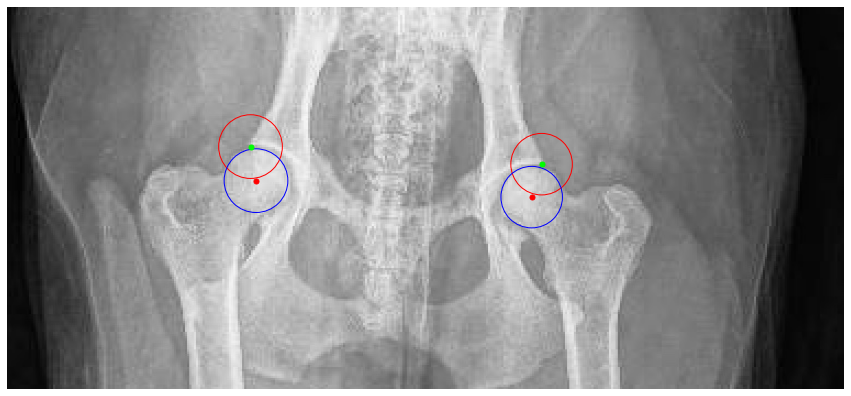

Processing /home/featurize/work/Dataset2/data/Testing/Images/358275.jpeg
head: [[[180  92]]

 [[424  94]]]
center: [[[183 119]]

 [[426 121]]]


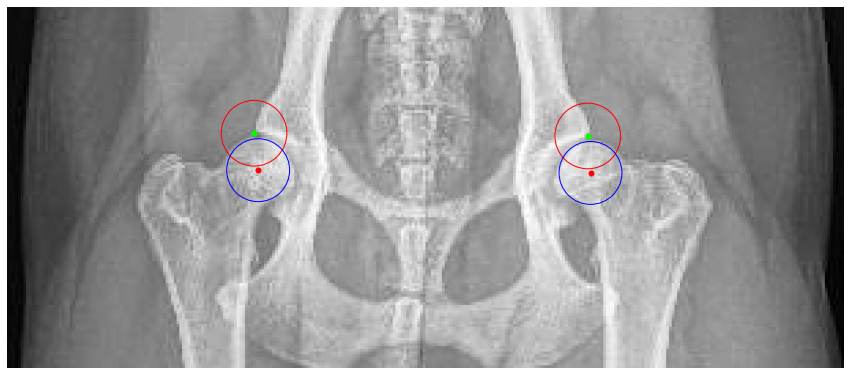

Processing /home/featurize/work/Dataset2/data/Testing/Images/364394.jpeg
head: [[[132  57]]

 [[390  60]]]
center: [[[143  84]]

 [[380  86]]]


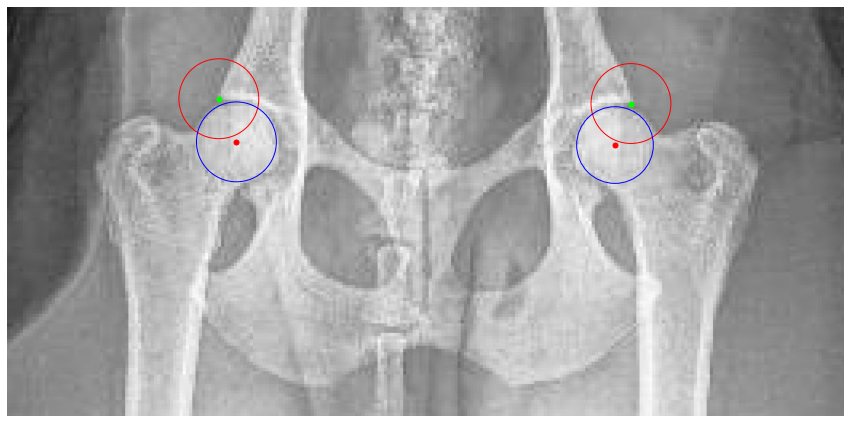

Processing /home/featurize/work/Dataset2/data/Testing/Images/353262.jpg
head: [[[1296  115]]

 [[ 428  261]]]
center: [[[ 481  350]]

 [[1291  214]]]


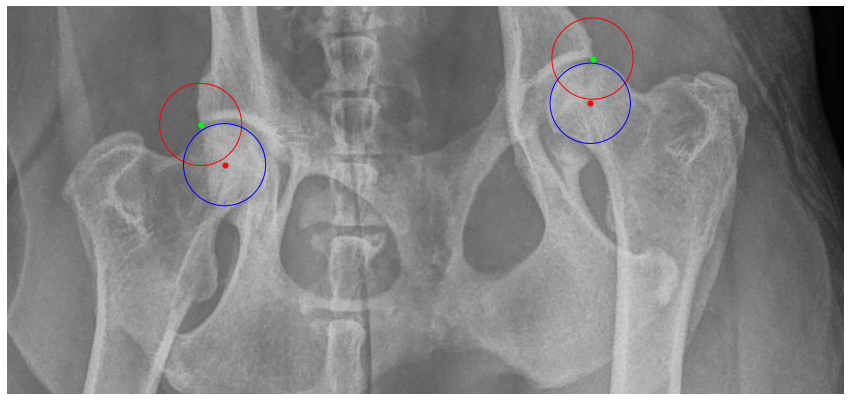

Processing /home/featurize/work/Dataset2/data/Testing/Images/359216.jpeg
head: [[[168  79]]

 [[413  84]]]
center: [[[406 121]]

 [[169 115]]]


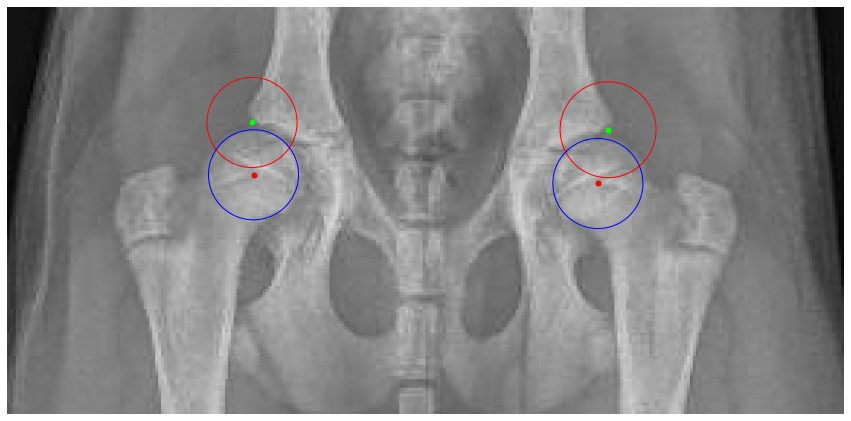

Processing /home/featurize/work/Dataset2/data/Testing/Images/352697.jpeg
head: [[[508 102]]

 [[204 103]]]
center: [[[215 133]]

 [[502 132]]]


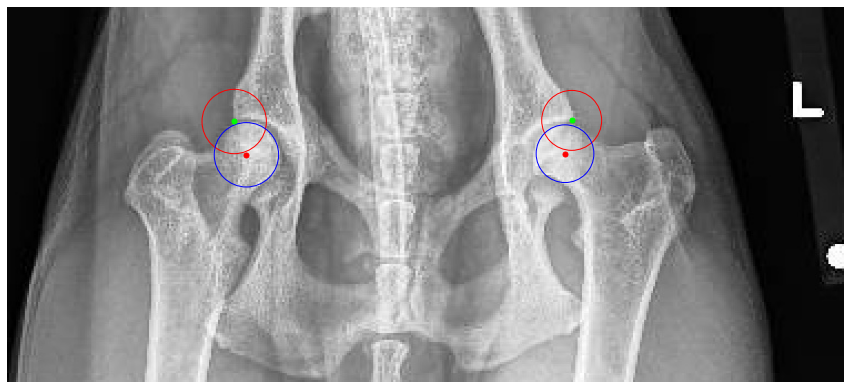

Processing /home/featurize/work/Dataset2/data/Testing/Images/359792.jpeg
head: [[[461 100]]

 [[174  73]]]
center: [[[447 130]]

 [[176 105]]]


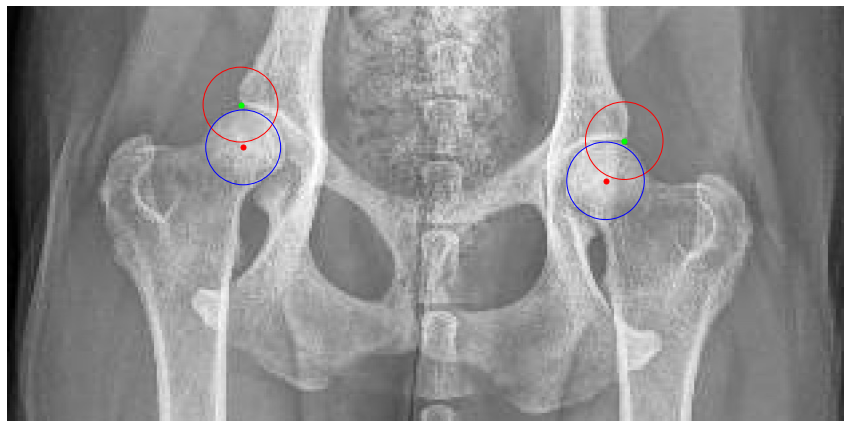

Processing /home/featurize/work/Dataset2/data/Testing/Images/360132.jpeg
head: [[[149  62]]

 [[472  71]]]
center: [[[455 105]]

 [[162  97]]]


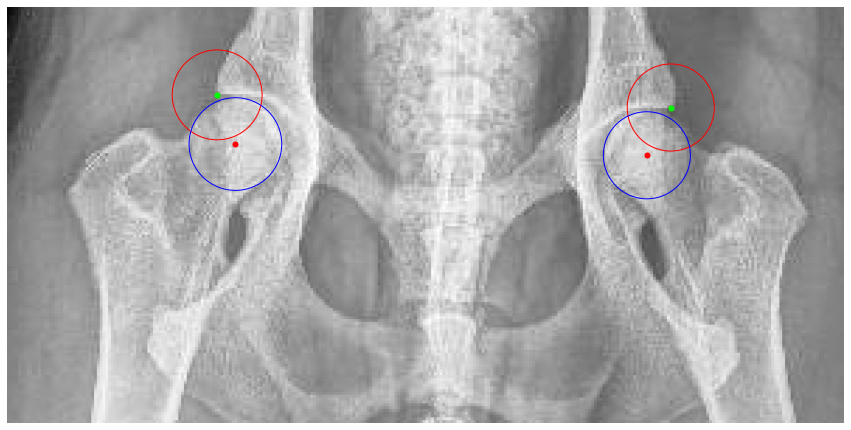

Processing /home/featurize/work/Dataset2/data/Testing/Images/251256.jpg
head: [[[ 322  122]]

 [[1066  222]]]
center: [[[1015  294]]

 [[ 301  206]]]


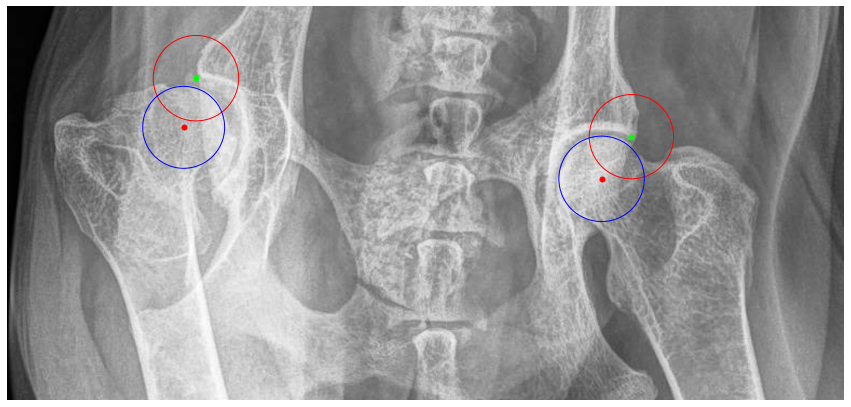

Processing /home/featurize/work/Dataset2/data/Testing/Images/350186.jpeg
head: [[[218 125]]

 [[517 129]]]
center: [[[505 160]]

 [[230 157]]]


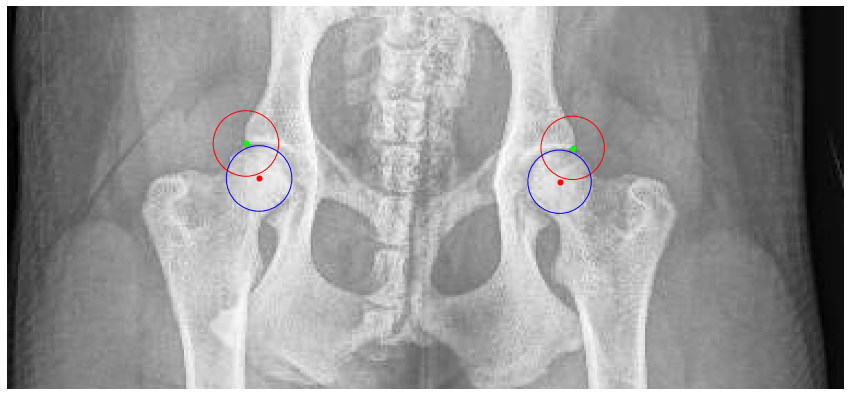

Processing /home/featurize/work/Dataset2/data/Testing/Images/367031.jpg
head: [[[992 136]]

 [[289 147]]]
center: [[[968 214]]

 [[320 226]]]


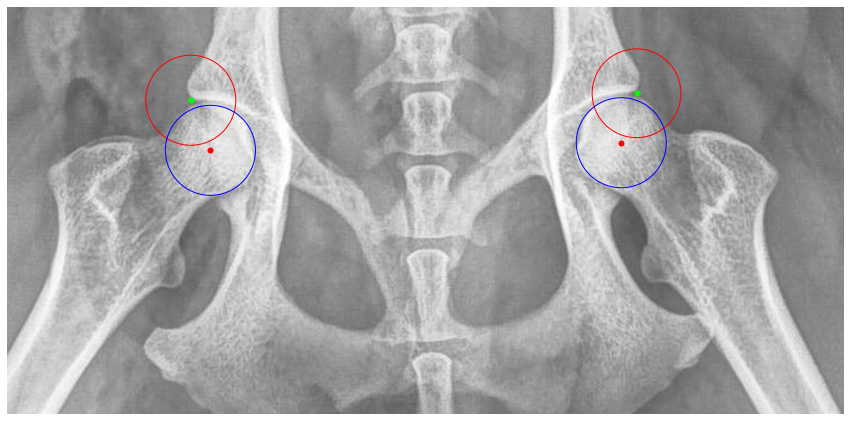

Processing /home/featurize/work/Dataset2/data/Testing/Images/348064.jpeg
head: [[[525 114]]

 [[210 128]]]
center: [[[229 162]]

 [[509 150]]]


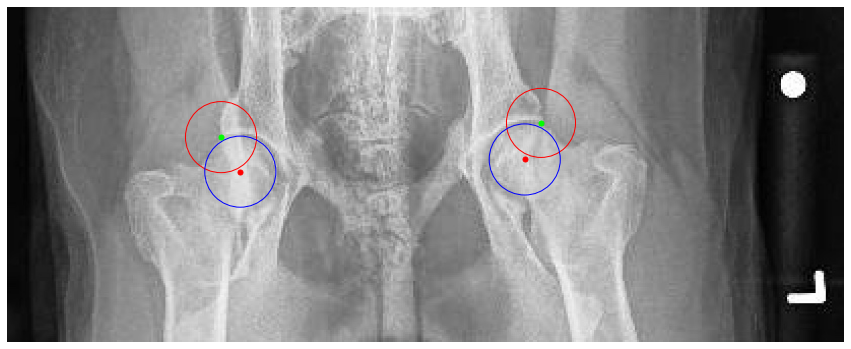

Processing /home/featurize/work/Dataset2/data/Testing/Images/337935.jpeg
head: [[[905 154]]

 [[403 197]]]
center: [[[899 210]]

 [[421 251]]]


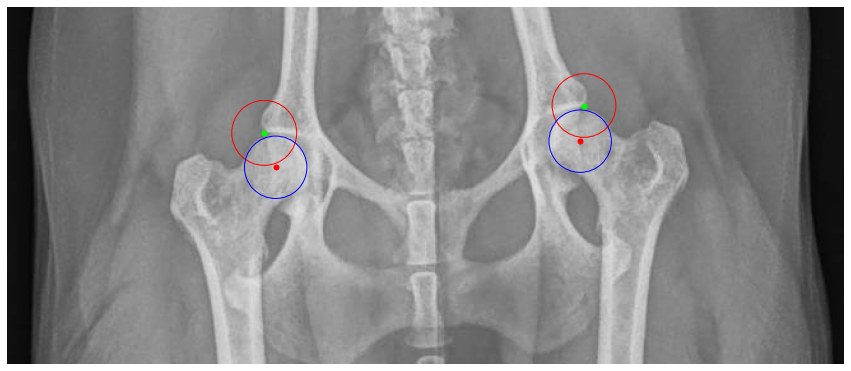

Processing /home/featurize/work/Dataset2/data/Testing/Images/360778.jpeg
head: [[[541 103]]

 [[208  96]]]
center: [[[543 140]]

 [[199 133]]]


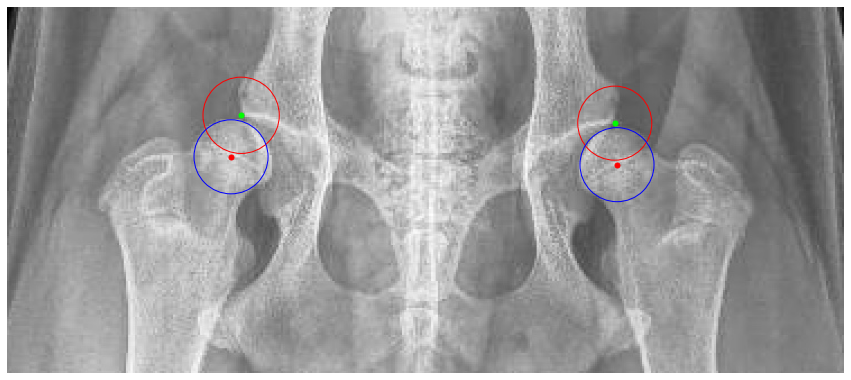

Processing /home/featurize/work/Dataset2/data/Testing/Images/204964.jpg
head: [[[ 329  243]]

 [[1202  436]]]
center: [[[1146  524]]

 [[ 339  341]]]


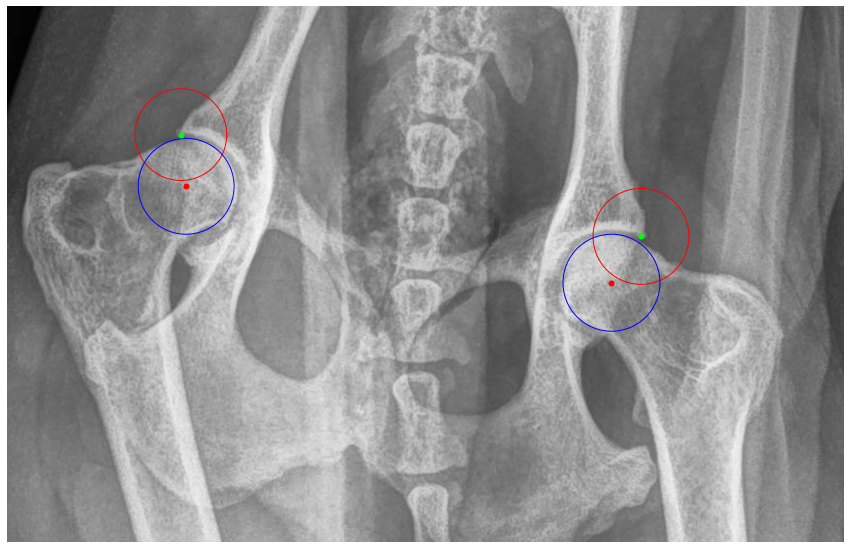

Processing /home/featurize/work/Dataset2/data/Testing/Images/357039.jpeg
head: [[[516  91]]

 [[234 103]]]
center: [[[507 122]]

 [[249 133]]]


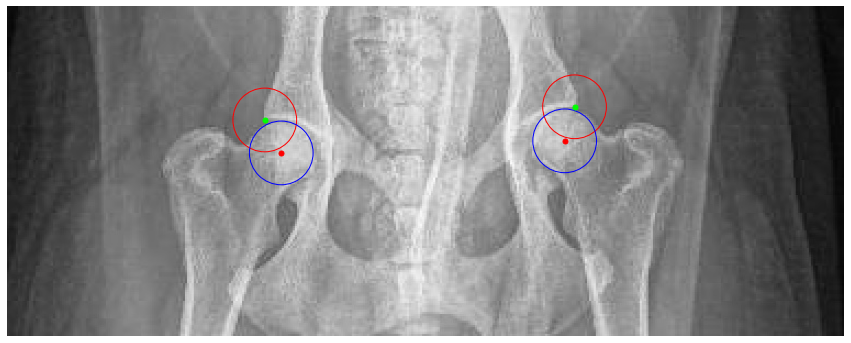

Processing /home/featurize/work/Dataset2/data/Testing/Images/261359.jpeg
head: [[[287  30]]

 [[115  38]]]
center: [[[282  48]]

 [[121  56]]]


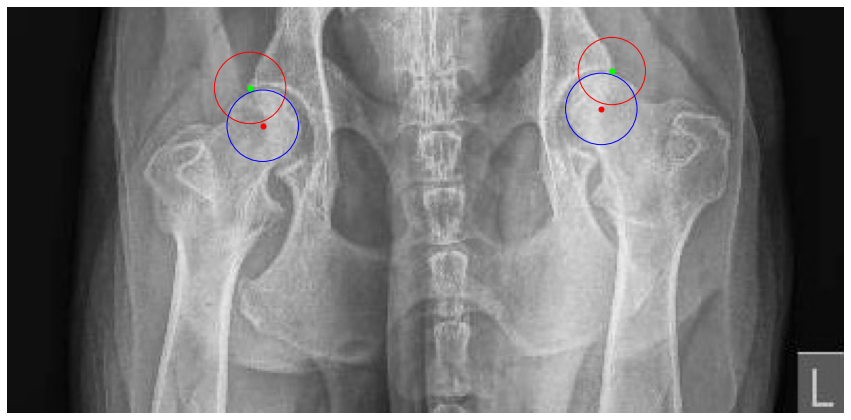

Processing /home/featurize/work/Dataset2/data/Testing/Images/363515.jpeg
head: [[[190  72]]

 [[497  89]]]
center: [[[195 108]]

 [[484 122]]]


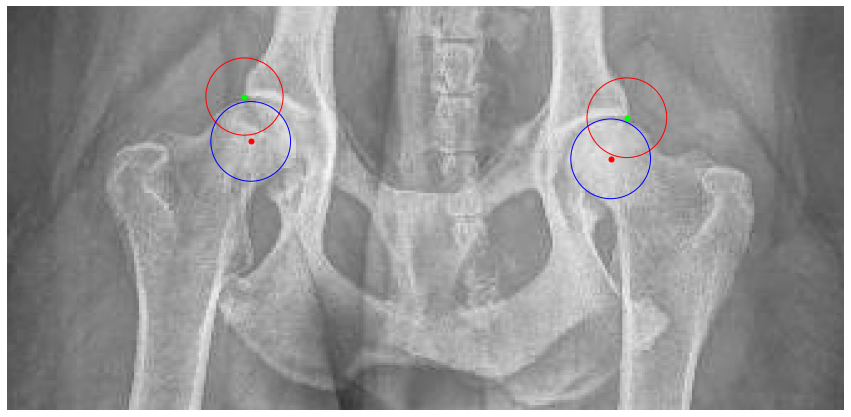

Processing /home/featurize/work/Dataset2/data/Testing/Images/359626.jpeg
head: [[[416  92]]

 [[149  94]]]
center: [[[407 121]]

 [[159 123]]]


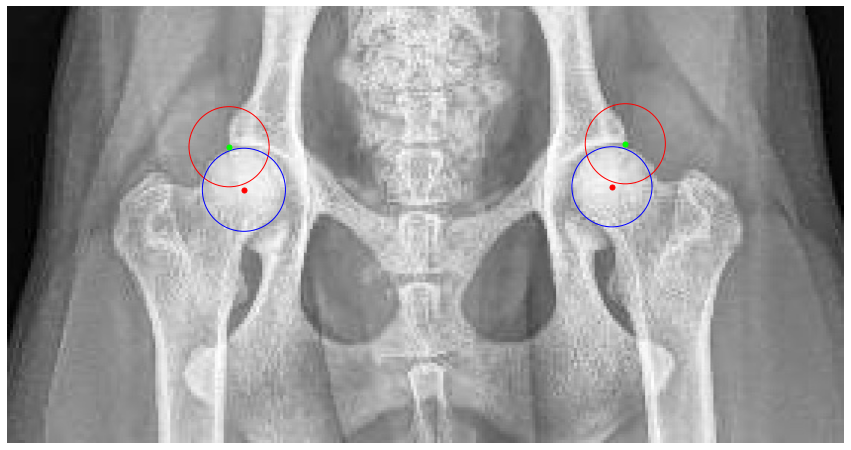

Processing /home/featurize/work/Dataset2/data/Testing/Images/341649.jpeg
head: [[[585 176]]

 [[295 168]]]
center: [[[273 190]]

 [[607 199]]]


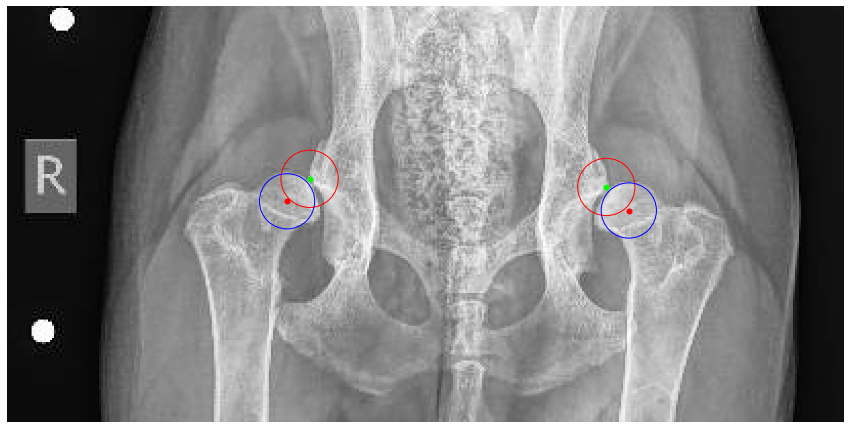

Processing /home/featurize/work/Dataset2/data/Testing/Images/348002.jpeg
head: [[[452  61]]

 [[206  97]]]
center: [[[445  90]]

 [[221 123]]]


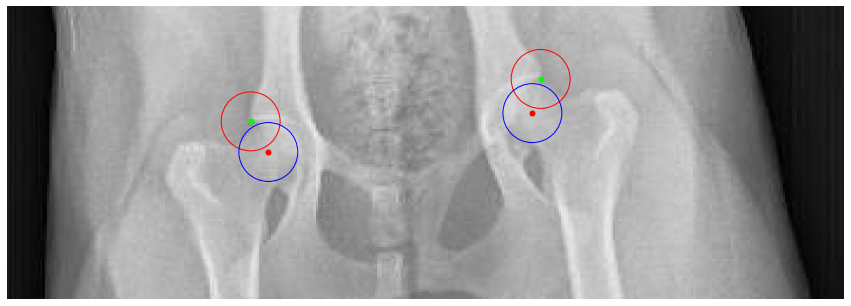

Processing /home/featurize/work/Dataset2/data/Testing/Images/359782.jpeg
head: [[[192  96]]

 [[520  99]]]
center: [[[201 131]]

 [[510 133]]]


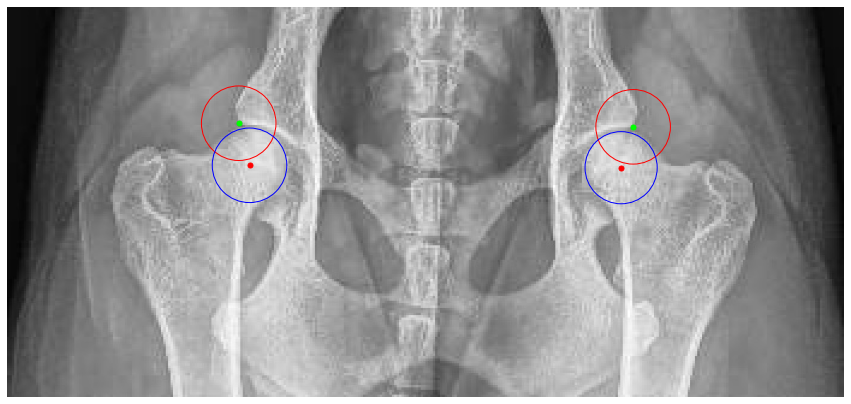

Processing /home/featurize/work/Dataset2/data/Testing/Images/270257.jpeg
head: [[[283  93]]

 [[588  67]]]
center: [[[590 101]]

 [[293 128]]]


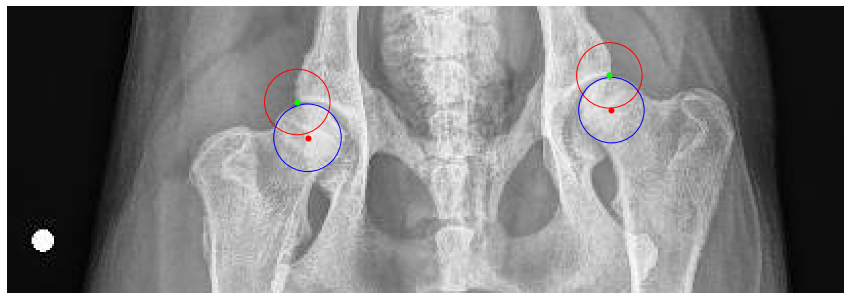

Processing /home/featurize/work/Dataset2/data/Testing/Images/350556.jpeg
head: [[[187  85]]

 [[463  69]]]
center: [[[469  97]]

 [[193 117]]]


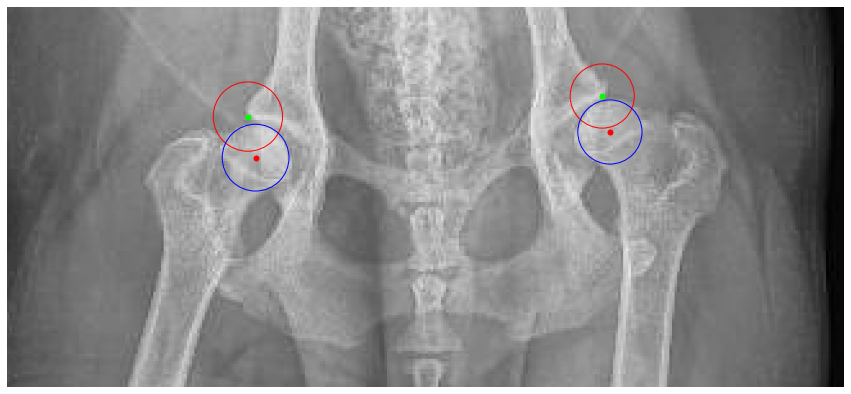

Processing /home/featurize/work/Dataset2/data/Testing/Images/360678.jpg
head: [[[1075  126]]

 [[ 287  130]]]
center: [[[1041  210]]

 [[ 321  218]]]


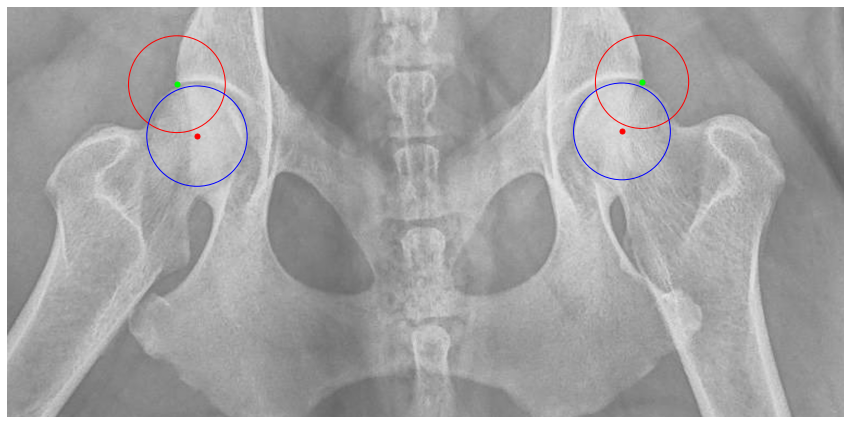

Processing /home/featurize/work/Dataset2/data/Testing/Images/364276.jpeg
head: [[[460 114]]

 [[178 128]]]
center: [[[447 152]]

 [[194 165]]]


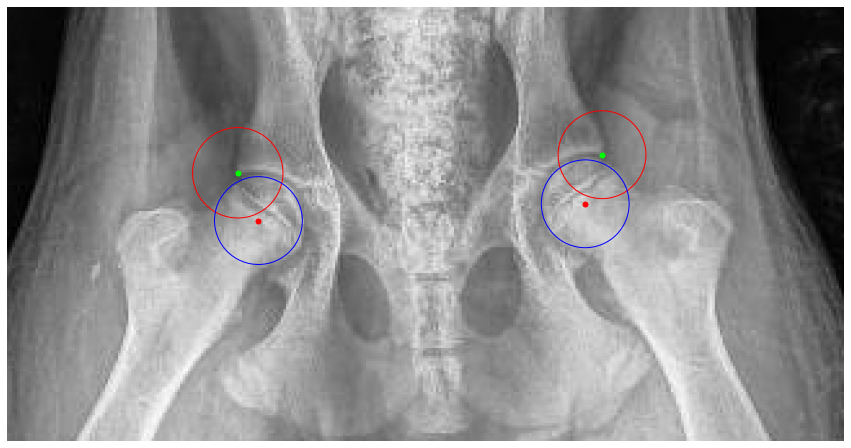

Processing /home/featurize/work/Dataset2/data/Testing/Images/349607.jpeg
head: [[[517 118]]

 [[203 128]]]
center: [[[214 159]]

 [[511 150]]]


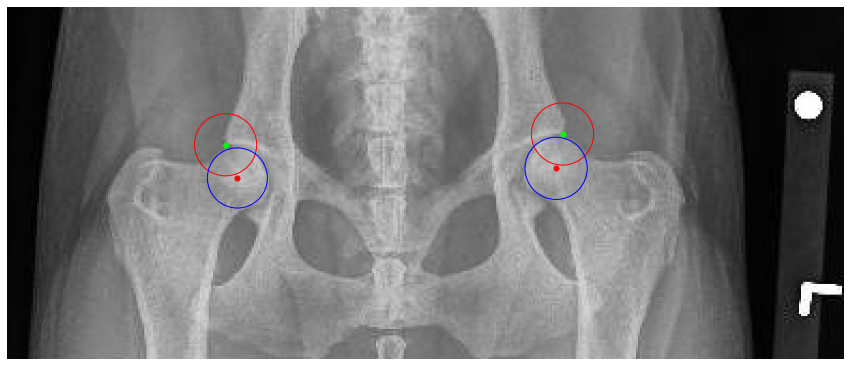

Processing /home/featurize/work/Dataset2/data/Testing/Images/302735.jpeg
head: [[[294 111]]

 [[562 117]]]
center: [[[551 144]]

 [[306 139]]]


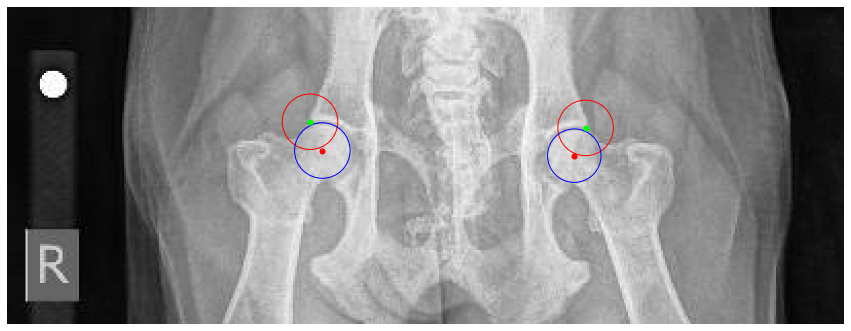

Processing /home/featurize/work/Dataset2/data/Testing/Images/361188.jpeg
head: [[[419  55]]

 [[156  77]]]
center: [[[413  91]]

 [[169 110]]]


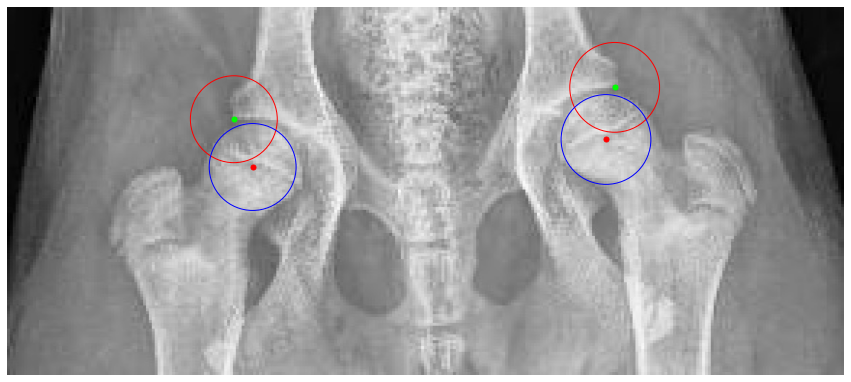

Processing /home/featurize/work/Dataset2/data/Testing/Images/335450.jpeg
head: [[[497 137]]

 [[245 120]]]
center: [[[486 164]]

 [[248 149]]]


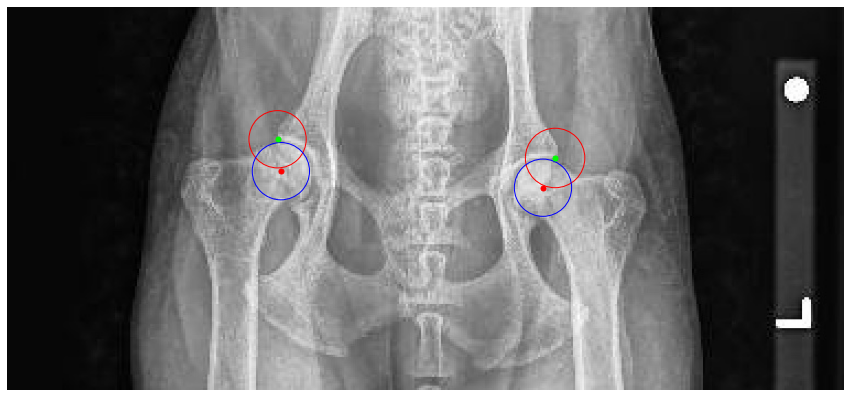

Processing /home/featurize/work/Dataset2/data/Testing/Images/352456.jpeg
head: [[[502 107]]

 [[219  98]]]
center: [[[492 138]]

 [[230 129]]]


In [ ]:
img_dir = '/home/featurize/work/Dataset2/data/Testing/Images'
image_files = [f for f in os.listdir(img_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

colors = [
    (255, 0, 0),    # 红色
    (0, 255, 0),    # 绿色
    (0, 0, 255),    # 蓝色
    (255, 255, 0),  # 黄色
]

for image_file in image_files:
    image_path = os.path.join(img_dir, image_file)
    print(f'Processing {image_path}')
    image = imread(image_path)
    
    init_default_scope(detector.cfg.get('default_scope', 'mmdet'))
    
    detect_result_all = inference_detector(detector, image_path)
    
    CONF_THRES = 0.38

    pred_instance_all = detect_result_all.pred_instances.cuda().numpy()
    bboxes_all = np.concatenate((pred_instance_all.bboxes, pred_instance_all.scores[:, None]), axis=1)
    bboxes_head = bboxes_all[np.logical_and(pred_instance_all.labels == 0, pred_instance_all.scores > CONF_THRES)]
    bboxes_center = bboxes_all[np.logical_and(pred_instance_all.labels == 1, pred_instance_all.scores > CONF_THRES)]
    bboxes_head = bboxes_head[nms(bboxes_head, 0.3)][:, :4].astype('int')
    bboxes_center = bboxes_center[nms(bboxes_center, 0.3)][:, :4].astype('int')
    
    if len(bboxes_head) > 0:
        pose_results_head = inference_topdown(pose_estimator, image_path, bboxes_head)
        
        try:
            data_samples_head = merge_data_samples(pose_results_head)
            head = data_samples_head.pred_instances.keypoints.astype('int')
            print(f'head: {head}')
        except ValueError as e:
            print(f'Error merging data samples: {e}')
            continue
                
    if len(bboxes_center) > 0:
        pose_results_center = inference_topdown(pose_estimator, image_path, bboxes_center)
        
        try:
            data_samples_center = merge_data_samples(pose_results_center)
            center = data_samples_center.pred_instances.keypoints.astype('int')
            print(f'center: {center}')
        except ValueError as e:
            print(f'Error merging data samples: {e}')
            continue
        
    #####plot
    fig, ax = plt.subplots(figsize=(15, 15))  
    ax.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    ax.set_aspect('equal', 'box')

    # 绘制中心关键点和矩形框、圆圈
    if len(bboxes_head) > 0:
        for idx, bbox in enumerate(bboxes_head):
            keypoint = head[idx]
            #rect = patches.Rectangle((bbox[0], bbox[1]), bbox[2] - bbox[0], bbox[3] - bbox[1], linewidth=1, edgecolor='g', facecolor='none')
            #ax.add_patch(rect)
            
            
            # 绘制关键点
            
            for x, y in keypoint:
                all_x = x
                all_y = y
                radius = max(bbox[2] - bbox[0], bbox[3] - bbox[1]) // 2
                circle = plt.Circle((all_x, all_y), radius, color='r', fill=False)
                ax.add_patch(circle)
                ax.plot(x, y, 'o', color=np.array(colors[1])/255.0, markersize=5)

    if len(bboxes_center) > 0:
        for idx, bbox in enumerate(bboxes_center):
            keypoint = center[idx]
            #rect = patches.Rectangle((bbox[0], bbox[1]), bbox[2] - bbox[0], bbox[3] - bbox[1], linewidth=1, edgecolor='g', facecolor='none')
            #ax.add_patch(rect)
            
            
            # 绘制关键点
            
            for x, y in keypoint:
                all_x = x
                all_y = y
                radius = min(bbox[2] - bbox[0], bbox[3] - bbox[1]) // 2
                circle = plt.Circle((all_x, all_y), radius, color='b', fill=False)
                ax.add_patch(circle)
                ax.plot(x, y, 'o', color=np.array(colors[0])/255.0, markersize=5)
    plt.axis('off')
    plt.show()

In [15]:
## Predict
def predict_and_plot(image_path, detector, pose_estimator, conf_thres_center=0.39, conf_thres_head=0.46):
    print(f'Processing {image_path}')
    image = imread(image_path)

    colors = [
        (255, 0, 0),    # 红色
        (0, 255, 0),    # 绿色
        (0, 0, 255),    # 蓝色
        (255, 255, 0),  # 黄色
    ]

    init_default_scope(detector.cfg.get('default_scope', 'mmdet'))
    
    detect_result_all = inference_detector(detector, image_path)
    

    pred_instance_all = detect_result_all.pred_instances.cuda().numpy()
    bboxes_all = np.concatenate((pred_instance_all.bboxes, pred_instance_all.scores[:, None]), axis=1)
    bboxes_head = bboxes_all[np.logical_and(pred_instance_all.labels == 0, pred_instance_all.scores > conf_thres_head)]
    bboxes_center = bboxes_all[np.logical_and(pred_instance_all.labels == 1, pred_instance_all.scores > conf_thres_center)]
    bboxes_head = bboxes_head[nms(bboxes_head, 0.3)][:, :4].astype('int')
    bboxes_center = bboxes_center[nms(bboxes_center, 0.3)][:, :4].astype('int')
    
    # head
    if len(bboxes_head) > 0:
        pose_results_head = inference_topdown(pose_estimator, image_path, bboxes_head)
        
        try:
            data_samples_head = merge_data_samples(pose_results_head)
            head = data_samples_head.pred_instances.keypoints.astype('int')
            #print(f'head: {head}')
        except ValueError as e:
            print(f'Error merging data samples: {e}')
            

    # center   
    if len(bboxes_center) > 0:
        pose_results_center = inference_topdown(pose_estimator, image_path, bboxes_center)
        
        try:
            data_samples_center = merge_data_samples(pose_results_center)
            center = data_samples_center.pred_instances.keypoints.astype('int')
            #print(f'center: {center}')
        except ValueError as e:
            print(f'Error merging data samples: {e}')
            

    #####plot
    fig, ax = plt.subplots(figsize=(15, 15))  
    ax.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    ax.set_aspect('equal', 'box')

    # 绘制中心关键点和矩形框、圆圈
    if len(bboxes_center) > 0:
        for idx, bbox in enumerate(bboxes_center):
            keypoint = center[idx]
            for x, y in keypoint:
                center_x = x
                center_y = y
                radius = max(bbox[2] - bbox[0], bbox[3] - bbox[1]) // 2
                circle = plt.Circle((center_x, center_y), radius, color='b', fill=False)
                ax.add_patch(circle)
                ax.plot(x, y, 'o', color=np.array(colors[0])/255.0, markersize=5)

    # 
    if len(bboxes_head) > 0:
        for idx, bbox in enumerate(bboxes_head):
            keypoint = head[idx]
            for x, y in keypoint:
                ax.plot(x, y, 'o', color=np.array(colors[1])/255.0, markersize=5)

    plt.axis('off')
    plt.show()

Processing /home/featurize/work/Dataset2/data/Testing/Images/361122.jpg
09/17 07:37:27 - mmengine - WARNING - The current default scope "mmdet" is not "mmpose", `init_default_scope` will force set the currentdefault scope to "mmpose".


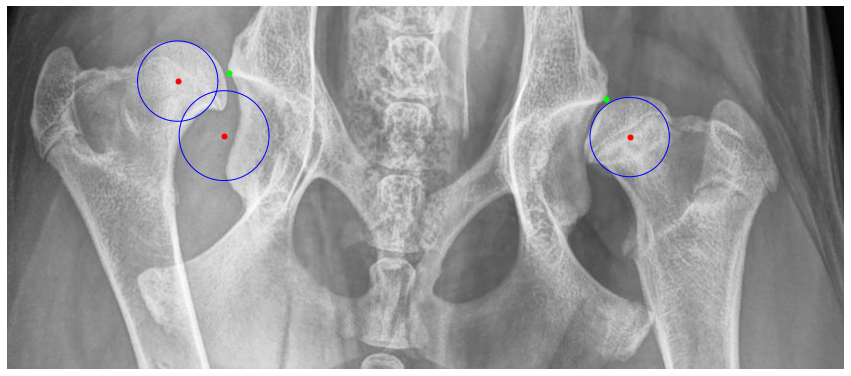

In [16]:
image_path = '/home/featurize/work/Dataset2/data/Testing/Images/361122.jpg'
predict_and_plot(image_path, detector, pose_estimator,  conf_thres_center=0.42, conf_thres_head=0.43)

Processing /home/featurize/data/filtered/dog_hip_103_16.png


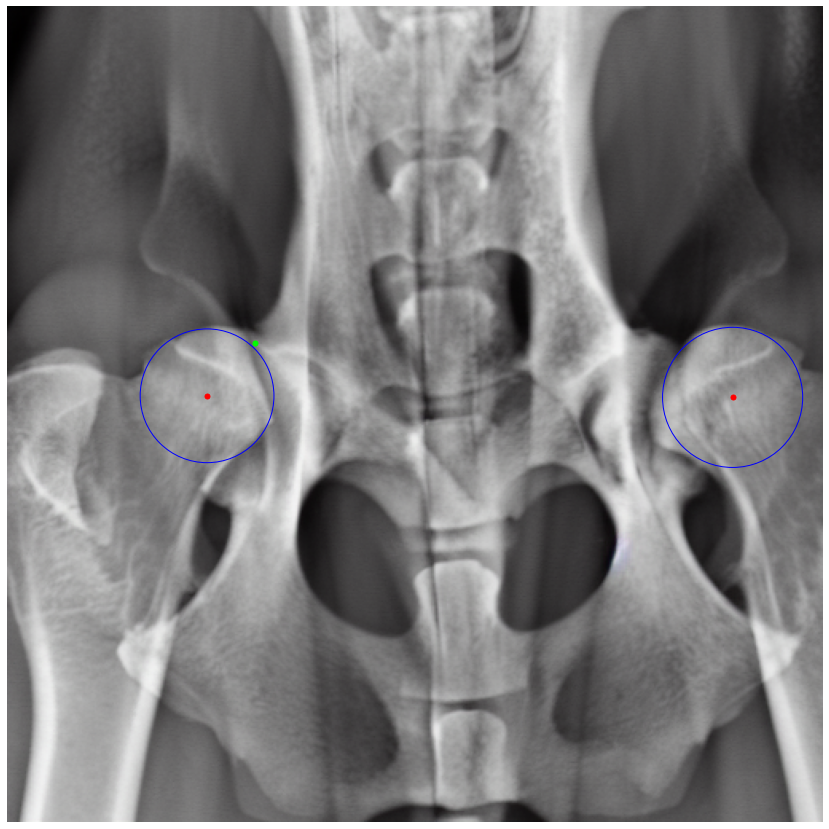

In [17]:
image_path = '/home/featurize/data/filtered/dog_hip_103_16.png'
predict_and_plot(image_path, detector, pose_estimator,  conf_thres_center=0.42, conf_thres_head=0.38)

In [19]:
def calculate_angle(center, head, opposite_center):
    """
    Calculate the angle formed by the three points: center1, head, and opposite_center.
    
    Parameters:
    - center1: The first center point.
    - head: The head point.
    - opposite_center: The opposite center point.
    
    Returns:
    - angle in degrees.
    """
    center = np.array(center)
    head = np.array(head)
    opposite_center = np.array(opposite_center)
    
    # Vector from center1 to head
    vector1 = head - center
    # Vector from center1 to opposite_center
    vector2 = opposite_center - center
    
    # Calculate the cosine of the angle using dot product and norms
    cos_angle = np.dot(vector1, vector2) / (np.linalg.norm(vector1) * np.linalg.norm(vector2))
    
    # Clamp the cosine value to the range [-1, 1] to avoid numerical issues
    cos_angle = np.clip(cos_angle, -1.0, 1.0)
    
    # Calculate the angle in radians and then convert to degrees
    angle = np.arccos(cos_angle)
    return np.degrees(angle)

def predict_and_save(image_path, mat_file_path, detector, pose_estimator, conf_thres_center=0.38, conf_thres_head=0.4):
    image = imread(image_path)
    mat_data = scipy.io.loadmat(mat_file_path)
    four_points = mat_data['Four_points']

    left_head = four_points[2]
    right_head = four_points[3]
    center1 = four_points[0]
    center2 = four_points[1]
    radius1 = four_points[4][0]
    radius2 = four_points[4][1]
    angles = mat_data['Angles']
    
    ### 
    init_default_scope(detector.cfg.get('default_scope', 'mmdet'))
    
    detect_result_all = inference_detector(detector, image_path)
    

    pred_instance_all = detect_result_all.pred_instances.cuda().numpy()
    bboxes_all = np.concatenate((pred_instance_all.bboxes, pred_instance_all.scores[:, None]), axis=1)
    bboxes_head = bboxes_all[np.logical_and(pred_instance_all.labels == 0, pred_instance_all.scores > conf_thres_head)]
    bboxes_center = bboxes_all[np.logical_and(pred_instance_all.labels == 1, pred_instance_all.scores > conf_thres_center)]
    bboxes_head = bboxes_head[nms(bboxes_head, 0.3)][:, :4].astype('int')
    bboxes_center = bboxes_center[nms(bboxes_center, 0.3)][:, :4].astype('int')
    
    # head
    heads_pred = []
    if len(bboxes_head) > 0:
        pose_results_head = inference_topdown(pose_estimator, image_path, bboxes_head)
        
        try:
            data_samples_head = merge_data_samples(pose_results_head)
            heads_pred = data_samples_head.pred_instances.keypoints.astype('int')
            #print(f'head: {head}')
        except ValueError as e:
            print(f'Error merging data samples: {e}')
            

    # center  
    centers_pred = []
    if len(bboxes_center) > 0:
        pose_results_center = inference_topdown(pose_estimator, image_path, bboxes_center)
        
        try:
            data_samples_center = merge_data_samples(pose_results_center)
            centers_pred = data_samples_center.pred_instances.keypoints.astype('int')
            #print(f'center: {center}')
        except ValueError as e:
            print(f'Error merging data samples: {e}')
    

    # Initialize DataFrame with ground truth values
    df = pd.DataFrame({
        'Image Path': [image_path],
        'Left Head X': [left_head[0]],
        'Left Head Y': [left_head[1]],
        'Right Head X': [right_head[0]],
        'Right Head Y': [right_head[1]],
        'Center1 X': [center1[0]],
        'Center1 Y': [center1[1]],
        'Center2 X': [center2[0]],
        'Center2 Y': [center2[1]],
        'Radius1': [radius1],
        'Radius2': [radius2],
        'Angle1': [angles[0][0]],
        'Angle2': [angles[0][1]],
        'Pred Left Head X': [np.nan],
        'Pred Left Head Y': [np.nan],
        'Pred Right Head X': [np.nan],
        'Pred Right Head Y': [np.nan],
        'Pred Center1 X': [np.nan],
        'Pred Center1 Y': [np.nan],
        'Pred Center2 X': [np.nan],
        'Pred Center2 Y': [np.nan],
        'Pred Radius1': [np.nan],
        'Pred Radius2': [np.nan],
        'Pred Angle1': [np.nan],
        'Pred Angle2': [np.nan]
    })

    # Update DataFrame with predicted values if predictions are available
    if len(centers_pred) >= 2 and len(heads_pred) >= 2:
        # 将预测的点按照x坐标进行排序，确保左边的为left，右边的为right
        centers_pred = sorted(centers_pred, key=lambda p: p[0, 0])
        heads_pred = sorted(heads_pred, key=lambda p: p[0, 0])

        predicted_radius1 = max(bboxes_center[0][2] - bboxes_center[0][0], bboxes_center[0][3] - bboxes_center[0][1]) // 2
        predicted_radius2 = max(bboxes_center[1][2] - bboxes_center[1][0], bboxes_center[1][3] - bboxes_center[1][1]) // 2
        predicted_angle1 = calculate_angle(centers_pred[0][0],heads_pred[0][0], centers_pred[1][0])
        predicted_angle2 = calculate_angle(centers_pred[1][0], heads_pred[1][0], centers_pred[0][0])

        pred_left_head = heads_pred[0][0]
        pred_right_head = heads_pred[1][0]
        pred_center1 = centers_pred[0][0]
        pred_center2 = centers_pred[1][0]

        df.loc[0, 'Pred Left Head X'] = pred_left_head[0]
        df.loc[0, 'Pred Left Head Y'] = pred_left_head[1]
        df.loc[0, 'Pred Right Head X'] = pred_right_head[0]
        df.loc[0, 'Pred Right Head Y'] = pred_right_head[1]
        df.loc[0, 'Pred Center1 X'] = pred_center1[0]
        df.loc[0, 'Pred Center1 Y'] = pred_center1[1]
        df.loc[0, 'Pred Center2 X'] = pred_center2[0]
        df.loc[0, 'Pred Center2 Y'] = pred_center2[1]
        df.loc[0, 'Pred Radius1'] = predicted_radius1
        df.loc[0, 'Pred Radius2'] = predicted_radius2
        df.loc[0, 'Pred Angle1'] = predicted_angle1
        df.loc[0, 'Pred Angle2'] = predicted_angle2

    return df

def process_all_images_and_save(image_dir, label_dir, detector, pose_estimator, conf_thres_center=0.38, conf_thres_head=0.4, output_dir='/home/featurize/work/Result'):
    image_files = [f for f in os.listdir(image_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    all_dfs = []

    for image_file in image_files:
        image_path = os.path.join(image_dir, image_file)
        mat_file_path = os.path.join(label_dir, os.path.splitext(image_file)[0] + '.mat')
        if os.path.exists(mat_file_path):
            df = predict_and_save(image_path, mat_file_path, detector, pose_estimator, conf_thres_center, conf_thres_head)
            all_dfs.append(df)
        else:
            print(f'MAT file for image {image_file} not found.')

    # Combine all dataframes and save to CSV
    final_df = pd.concat(all_dfs, ignore_index=True)
    #final_df.to_csv(os.path.join(output_dir, 'predictions_all.csv'), index=False)
    return final_df
# Example usage
#image_dir = '/home/featurize/work/Dataset2/data/Testing/Images'
#label_dir = '/home/featurize/work/Dataset2/data/Testing/Labels'
#process_all_images_and_save(image_dir, label_dir, detector, detector2, pose_estimator, pose_estimator2, conf_thres_center=0.39, conf_thres_head=0.46, output_dir='/home/featurize/work/Result')


In [23]:
# Example usage
image_dir = '/home/featurize/work/Dataset2/July_2024/Images'
label_dir = '/home/featurize/work/Dataset2/July_2024/Labels'
df1 =process_all_images_and_save(image_dir, label_dir, detector, pose_estimator, conf_thres_center=0.38, conf_thres_head=0.38, output_dir='/home/featurize/work/Result')

In [18]:
#df.to_csv('/home/featurize/work/Dataset2/data/Testing/Images/111.csv',index=False)

In [23]:
# distances = np.sqrt(
#     (df['Center2 X'] - df['Pred Center2 X']) ** 2 + 
#     (df['Center2 Y'] - df['Pred Center2 Y']) ** 2
# )

# # 计算距离的 MAE
# mae_distance = mean_absolute_error(distances, np.zeros_like(distances))

# print(f"MAE of distances between Center2 and Pred Center2: {mae_distance}")
# radius1_diff = np.abs(df['Radius1'] - df['Pred Radius1']).mean()
# radius2_diff = np.abs(df['Radius2'] - df['Pred Radius2']).mean()

# print(f"Average difference for Radius1: {radius1_diff}")
# print(f"Average difference for Radius2: {radius2_diff}")

# radius1_less_than = np.sum(df['Pred Radius1'] < df['Radius1'])
# radius2_less_than = np.sum(df['Pred Radius2'] < df['Radius2'])

# # 计算总的样本数量
# total_samples = len(df)

# # 计算百分比
# radius1_percentage = (radius1_less_than / total_samples) * 100
# radius2_percentage = (radius2_less_than / total_samples) * 100

# print(f"Percentage of Pred Radius1 < Radius1: {radius1_percentage}%")
# print(f"Percentage of Pred Radius2 < Radius2: {radius2_percentage}%")

In [24]:
# left_head_mae = mean_absolute_error(df[['Left Head X', 'Left Head Y']], df[['Pred Left Head X', 'Pred Left Head Y']])
# print(f"MAE for Left Head: {left_head_mae}")

# # 计算 Center1 的 MAE
# center1_mae = mean_absolute_error(df[['Center1 X', 'Center1 Y']], df[['Pred Center1 X', 'Pred Center1 Y']])
# print(f"MAE for Center1: {center1_mae}")

# # 计算 Right Head 的 MAE
# right_head_mae = mean_absolute_error(df[['Right Head X', 'Right Head Y']], df[['Pred Right Head X', 'Pred Right Head Y']])
# print(f"MAE for Right Head: {right_head_mae}")

# # 计算 Center2 的 MAE
# center2_mae = mean_absolute_error(df[['Center2 X', 'Center2 Y']], df[['Pred Center2 X', 'Pred Center2 Y']])
# print(f"MAE for Center2: {center2_mae}")

In [25]:
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, r2_score,mean_absolute_error
import seaborn as sns

def classify_na(angle):
    if angle >= 105:
        return 'Excellent'
    elif 100 <= angle < 105:
        return 'Good'
    elif 95 <= angle < 100:
        return 'Fair'
    elif 90 <= angle < 95:
        return 'Borderline'
    elif 85 <= angle < 90:
        return 'Mild'
    elif 80 <= angle < 85:
        return 'Moderate'
    elif angle < 80:
        return 'Severe'
    else:
        return 'Unknown'
    
def evaluate_df(df):
    # Calculate delta angles
    df['Delta Angle1'] = abs(df['Angle1'] - df['Pred Angle1'])
    df['Delta Angle2'] = abs(df['Angle2'] - df['Pred Angle2'])

    percentage_less_than_1_degree = (
        ((df['Delta Angle1'] < 1).sum() + (df['Delta Angle2'] < 1).sum()) / (2 * len(df))
    ) * 100

    percentage_less_than_5_degrees = (
        ((df['Delta Angle1'] < 5).sum() + (df['Delta Angle2'] < 5).sum()) / (2 * len(df))
    ) * 100

    percentage_less_than_10_degrees = (
        ((df['Delta Angle1'] < 10).sum() + (df['Delta Angle2'] < 10).sum()) / (2 * len(df))
    ) * 100

    print(f"Percentage of angles with less than 1 degree error: {percentage_less_than_1_degree:.2f}%")
    print(f"Percentage of angles with less than 5 degrees error: {percentage_less_than_5_degrees:.2f}%")
    print(f"Percentage of angles with less than 10 degrees error: {percentage_less_than_10_degrees:.2f}%")

    # Calculate percentage for Angle1 and Angle2 < 5 and < 10 degrees
    angle1_under_5 = (df['Delta Angle1'] < 5).sum()
    angle2_under_5 = (df['Delta Angle2'] < 5).sum()
    total_entries = len(df)

    percentage_angle1_under_5 = (angle1_under_5 / total_entries) * 100
    percentage_angle2_under_5 = (angle2_under_5 / total_entries) * 100

    print(f"Percentage of Delta Angle1 < 5: {percentage_angle1_under_5:.2f}%")
    print(f"Percentage of Delta Angle2 < 5: {percentage_angle2_under_5:.2f}%")

    angle1_under_10 = (df['Delta Angle1'] < 10).sum()
    angle2_under_10 = (df['Delta Angle2'] < 10).sum()

    percentage_angle1_under_10 = (angle1_under_10 / total_entries) * 100
    percentage_angle2_under_10 = (angle2_under_10 / total_entries) * 100

    print(f"Percentage of Delta Angle1 < 10: {percentage_angle1_under_10:.2f}%")
    print(f"Percentage of Delta Angle2 < 10: {percentage_angle2_under_10:.2f}%")
    
    # MAE calculation for angles
    mae_angle1 = mean_absolute_error(df['Angle1'], df['Pred Angle1'])
    mae_angle2 = mean_absolute_error(df['Angle2'], df['Pred Angle2'])
    combined_angles_true = df[['Angle1', 'Angle2']].values.flatten()
    combined_angles_pred = df[['Pred Angle1', 'Pred Angle2']].values.flatten()
    mae_combined_angles = mean_absolute_error(combined_angles_true, combined_angles_pred)

    print(f"MAE for Angle1: {mae_angle1}")
    print(f"MAE for Angle2: {mae_angle2}")
    print(f"MAE for all Angles: {mae_combined_angles}")

    # MSE calculation for points, radii, and angles
    mse_point = mean_squared_error(df[['Left Head X', 'Left Head Y', 'Right Head X', 'Right Head Y', 'Center1 X', 'Center1 Y', 'Center2 X', 'Center2 Y']],
                                   df[['Pred Left Head X', 'Pred Left Head Y', 'Pred Right Head X', 'Pred Right Head Y', 'Pred Center1 X', 'Pred Center1 Y', 'Pred Center2 X', 'Pred Center2 Y']])

    mse_angle = mean_squared_error(df[['Angle1', 'Angle2']],
                                   df[['Pred Angle1', 'Pred Angle2']])

    mse_radius = mean_squared_error(df[['Radius1', 'Radius2']],
                                    df[['Pred Radius1', 'Pred Radius2']])

    # MAE calculation for points, radii
    mae_point = mean_absolute_error(df[['Left Head X', 'Left Head Y', 'Right Head X', 'Right Head Y', 'Center1 X', 'Center1 Y', 'Center2 X', 'Center2 Y']],
                                    df[['Pred Left Head X', 'Pred Left Head Y', 'Pred Right Head X', 'Pred Right Head Y', 'Pred Center1 X', 'Pred Center1 Y', 'Pred Center2 X', 'Pred Center2 Y']])

    mae_radius = mean_absolute_error(df[['Radius1', 'Radius2']],
                                     df[['Pred Radius1', 'Pred Radius2']])

    # MAPE calculation for points, radii, and angles
    mape_point = mean_absolute_percentage_error(df[['Left Head X', 'Left Head Y', 'Right Head X', 'Right Head Y', 'Center1 X', 'Center1 Y', 'Center2 X', 'Center2 Y']],
                                                df[['Pred Left Head X', 'Pred Left Head Y', 'Pred Right Head X', 'Pred Right Head Y', 'Pred Center1 X', 'Pred Center1 Y', 'Pred Center2 X', 'Pred Center2 Y']])

    mape_angle = mean_absolute_percentage_error(df[['Angle1', 'Angle2']],
                                                df[['Pred Angle1', 'Pred Angle2']])

    mape_radius = mean_absolute_percentage_error(df[['Radius1', 'Radius2']],
                                                 df[['Pred Radius1', 'Pred Radius2']])

    # R2 score for points, radii, and angles
    r2_head_left = r2_score(df[['Left Head X', 'Left Head Y']],
                            df[['Pred Left Head X', 'Pred Left Head Y']])

    r2_head_right = r2_score(df[['Right Head X', 'Right Head Y']],
                             df[['Pred Right Head X', 'Pred Right Head Y']])

    r2_center1 = r2_score(df[['Center1 X', 'Center1 Y']],
                          df[['Pred Center1 X', 'Pred Center1 Y']])

    r2_center2 = r2_score(df[['Center2 X', 'Center2 Y']],
                          df[['Pred Center2 X', 'Pred Center2 Y']])

    r2_angle = r2_score(df[['Angle1', 'Angle2']],
                        df[['Pred Angle1', 'Pred Angle2']])
    
    r2_radius = r2_score(df[['Radius1', 'Radius2']],
                        df[['Pred Radius1', 'Pred Radius2']])
    
    print(f"MSE Point: {mse_point}")
    print(f"MSE Angle: {mse_angle}")
    print(f"MSE Radius: {mse_radius}")
    print(f"MAE Point: {mae_point}")
    print(f"MAE Radius: {mae_radius}")
    print(f"MAPE Point: {mape_point}")
    print(f"MAPE Angle: {mape_angle}")
    print(f"MAPE Radius: {mape_radius}")
    print(f"R2 Head Left: {r2_head_left}")
    print(f"R2 Head Right: {r2_head_right}")
    print(f"R2 Center1: {r2_center1}")
    print(f"R2 Center2: {r2_center2}")
    print(f"R2 Angle: {r2_angle}")
    print(f"R2 radius: {r2_radius}")


In [ ]:
evaluate_df(df)

In [26]:
evaluate_df(df1)

Percentage of angles with less than 1 degree error: 20.23%
Percentage of angles with less than 5 degrees error: 76.34%
Percentage of angles with less than 10 degrees error: 97.33%
Percentage of Delta Angle1 < 5: 77.86%
Percentage of Delta Angle2 < 5: 74.81%
Percentage of Delta Angle1 < 10: 95.42%
Percentage of Delta Angle2 < 10: 99.24%
MAE for Angle1: 3.5328217336030443
MAE for Angle2: 3.3032980527945024
MAE for all Angles: 3.418059893198773
MSE Point: 9.122602735046812
MSE Angle: 20.080240771956397
MSE Radius: 6.435377862072427
MAE Point: 2.206674554843234
MAE Radius: 1.7676096239406194
MAPE Point: 0.015384475615634706
MAPE Angle: 0.03812098115102251
MAPE Radius: 0.03870754168759687
R2 Head Left: 0.9884283894427135
R2 Head Right: 0.9959372282544122
R2 Center1: 0.9935722323885787
R2 Center2: 0.9968046325041305
R2 Angle: 0.8753032805289007
R2 radius: 0.9198280755786183


In [ ]:
image_dir = '/home/featurize/work/Dataset2/Tanay/Dog_hip_images/caption_1/Images'
label_dir = '/home/featurize/work/Dataset2/Tanay/Dog_hip_images/caption_1/Labels'
df_Tanay =process_all_images_and_save(image_dir, label_dir, detector, pose_estimator, conf_thres_center=0.38, conf_thres_head=0.38, output_dir='/home/featurize/work/Result')
evaluate_df(df_Tanay)

In [ ]:
output_dir = '/home/featurize/work/Dataset2/Tanay/Dog_hip_images/caption_1/Predict_1'
save_predictions_to_mat(df_Tanay, output_dir)

In [ ]:
image_dir = '/home/featurize/work/Dataset2/Tanay/Dog_hip_images/caption_2/Images'
label_dir = '/home/featurize/work/Dataset2/Tanay/Dog_hip_images/caption_2/Labels'
df_Tanay2 =process_all_images_and_save(image_dir, label_dir, detector, pose_estimator, conf_thres_center=0.38, conf_thres_head=0.38, output_dir='/home/featurize/work/Result')
evaluate_df(df_Tanay2)

In [ ]:
output_dir = '/home/featurize/work/Dataset2/Tanay/Dog_hip_images/caption_2/Predict_2'
save_predictions_to_mat(df_Tanay2, output_dir)

In [ ]:
image_dir = '/home/featurize/work/Dataset2/Tanay/Dog_hip_images/caption_3/Images'
label_dir = '/home/featurize/work/Dataset2/Tanay/Dog_hip_images/caption_3/Labels'
df_Tanay =process_all_images_and_save(image_dir, label_dir, detector, pose_estimator, conf_thres_center=0.38, conf_thres_head=0.38, output_dir='/home/featurize/work/Result')


In [ ]:
evaluate_df(df_Tanay)

In [ ]:
output_dir = '/home/featurize/work/Dataset2/Tanay/Dog_hip_images/caption_3/Predict_3'
save_predictions_to_mat(df_Tanay, output_dir)

In [18]:
## use different confidience threshold to compute best point

def calculate_error(pred_points, true_points):
    return np.mean(np.linalg.norm(pred_points - true_points, axis=1))

def predict_and_save_optimize(image_path, mat_file_path, detector, pose_estimator, conf_thres_center_range, conf_thres_head_range):
    image = imread(image_path)
    mat_data = scipy.io.loadmat(mat_file_path)
    four_points = mat_data['Four_points']

    left_head = four_points[2]
    right_head = four_points[3]
    center1 = four_points[0]
    center2 = four_points[1]
    radius1 = four_points[4][0]
    radius2 = four_points[4][1]
    Angles = mat_data['Angles']
    
    best_df = None
    best_error = float('inf')
    
    ###
    init_default_scope(detector.cfg.get('default_scope', 'mmdet'))
    
    detect_result_all = inference_detector(detector, image_path)
    pred_instance_all = detect_result_all.pred_instances.cuda().numpy()
    bboxes_all = np.concatenate((pred_instance_all.bboxes, pred_instance_all.scores[:, None]), axis=1)           
    
    ###
    for conf_thres_center in conf_thres_center_range:
        for conf_thres_head in conf_thres_head_range:
            init_default_scope(detector.cfg.get('default_scope', 'mmdet'))

            # Center detection
            bboxes_center = bboxes_all[np.logical_and(pred_instance_all.labels == 1, pred_instance_all.scores > conf_thres_center)]
            bboxes_center = bboxes_all[np.logical_and(pred_instance_all.labels == 1, pred_instance_all.scores > conf_thres_center)]
            bboxes_center = bboxes_center[nms(bboxes_center, 0.3)][:, :4].astype('int')

            centers_pred = []
            if len(bboxes_center) > 0:
                pose_results_center = inference_topdown(pose_estimator, image_path, bboxes_center)
                try:
                    data_samples_center = merge_data_samples(pose_results_center)
                    centers_pred = data_samples_center.pred_instances.keypoints.astype('int')
                except ValueError as e:
                    print(f'Error merging data samples: {e}')

            # Head detection
            bboxes_head = bboxes_all[np.logical_and(pred_instance_all.labels == 0, pred_instance_all.scores > conf_thres_head)]
            bboxes_head = bboxes_all[np.logical_and(pred_instance_all.labels == 0, pred_instance_all.scores > conf_thres_head)]
            bboxes_head = bboxes_head[nms(bboxes_head, 0.3)][:, :4].astype('int')

            heads_pred = []
            if len(bboxes_head) > 0:
                pose_results_head = inference_topdown(pose_estimator, image_path, bboxes_head)
                try:
                    data_samples_head = merge_data_samples(pose_results_head)
                    heads_pred = data_samples_head.pred_instances.keypoints.astype('int')
                except ValueError as e:
                    print(f'Error merging data samples: {e}')

            # Initialize DataFrame with ground truth values
            df = pd.DataFrame({
                'Image Path': [image_path],
                'Left Head X': [left_head[0]],
                'Left Head Y': [left_head[1]],
                'Right Head X': [right_head[0]],
                'Right Head Y': [right_head[1]],
                'Center1 X': [center1[0]],
                'Center1 Y': [center1[1]],
                'Center2 X': [center2[0]],
                'Center2 Y': [center2[1]],
                'Radius1': [radius1],
                'Radius2': [radius2],
                'Angle1': [Angles[0][0]],
                'Angle2': [Angles[0][1]],
                'Pred Left Head X': [np.nan],
                'Pred Left Head Y': [np.nan],
                'Pred Right Head X': [np.nan],
                'Pred Right Head Y': [np.nan],
                'Pred Center1 X': [np.nan],
                'Pred Center1 Y': [np.nan],
                'Pred Center2 X': [np.nan],
                'Pred Center2 Y': [np.nan],
                'Pred Radius1': [np.nan],
                'Pred Radius2': [np.nan],
                'Pred Angle1': [np.nan],
                'Pred Angle2': [np.nan]
            })

            # Update DataFrame with predicted values if predictions are available
            if len(centers_pred) == 2 and len(heads_pred) == 2:
                # 将预测的点按照x坐标进行排序，确保左边的为left，右边的为right
                centers_pred = sorted(centers_pred, key=lambda p: p[0, 0])
                heads_pred = sorted(heads_pred, key=lambda p: p[0, 0])

                predicted_radius1 = max(bboxes_center[0][2] - bboxes_center[0][0], bboxes_center[0][3] - bboxes_center[0][1]) // 2
                predicted_radius2 = max(bboxes_center[1][2] - bboxes_center[1][0], bboxes_center[1][3] - bboxes_center[1][1]) // 2
                predicted_angle1 = calculate_angle(centers_pred[0][0],heads_pred[0][0], centers_pred[1][0])
                predicted_angle2 = calculate_angle(centers_pred[1][0], heads_pred[1][0], centers_pred[0][0])


                pred_left_head = heads_pred[0][0]
                pred_right_head = heads_pred[1][0]
                pred_center1 = centers_pred[0][0]
                pred_center2 = centers_pred[1][0]

                df.loc[0, 'Pred Left Head X'] = pred_left_head[0]
                df.loc[0, 'Pred Left Head Y'] = pred_left_head[1]
                df.loc[0, 'Pred Right Head X'] = pred_right_head[0]
                df.loc[0, 'Pred Right Head Y'] = pred_right_head[1]
                df.loc[0, 'Pred Center1 X'] = pred_center1[0]
                df.loc[0, 'Pred Center1 Y'] = pred_center1[1]
                df.loc[0, 'Pred Center2 X'] = pred_center2[0]
                df.loc[0, 'Pred Center2 Y'] = pred_center2[1]
                df.loc[0, 'Pred Radius1'] = predicted_radius1
                df.loc[0, 'Pred Radius2'] = predicted_radius2
                df.loc[0, 'Pred Angle1'] = predicted_angle1
                df.loc[0, 'Pred Angle2'] = predicted_angle2

                # Calculate prediction error
                pred_points = np.array([pred_left_head, pred_right_head, pred_center1, pred_center2])
                true_points = np.array([left_head, right_head, center1, center2])
                error = calculate_error(pred_points, true_points)

                if error < best_error:
                    best_error = error
                    best_df = df

    return best_df

def process_all_images_and_save_optmize(image_dir, label_dir, detector, pose_estimator, conf_thres_center_range, conf_thres_head_range, output_dir):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    all_dfs = []
    for image_file in os.listdir(image_dir):
        image_path = os.path.join(image_dir, image_file)
        mat_file_path = os.path.join(label_dir, os.path.splitext(image_file)[0] + '.mat')
        if os.path.exists(mat_file_path):
            df = predict_and_save_optimize(image_path, mat_file_path, detector, pose_estimator, conf_thres_center_range, conf_thres_head_range)
            if df is not None:
                all_dfs.append(df)

    if all_dfs:
        final_df = pd.concat(all_dfs, ignore_index=True)
        #output_path = os.path.join(output_dir, 'predictions.csv')
        #final_df.to_csv(output_path, index=False)
    return final_df
# Example usage
image_dir = '/home/featurize/work/Dataset2/data/Testing/Images'
label_dir = '/home/featurize/work/Dataset2/data/Testing/Labels'
conf_thres_center_range = np.arange(0.3, 0.5, 0.05)
conf_thres_head_range = np.arange(0.3, 0.5, 0.05)
output_dir = '/home/featurize/work/Result'

#process_all_images_and_save(image_dir, label_dir, detector, detector2, pose_estimator, pose_estimator2, conf_thres_center_range, conf_thres_head_range, output_dir)

In [27]:
import time

start_time = time.time()

df2 = process_all_images_and_save_optmize(image_dir, label_dir, detector, pose_estimator, conf_thres_center_range, conf_thres_head_range, output_dir)

end_time = time.time()

execution_time = end_time - start_time
print(f"Execution time: {execution_time} seconds")

Execution time: 234.2797031402588 seconds


Percentage of angles with less than 1 degree error: 19.01%
Percentage of angles with less than 5 degrees error: 80.17%
Percentage of angles with less than 10 degrees error: 99.17%
Percentage of Delta Angle1 < 5: 76.03%
Percentage of Delta Angle2 < 5: 84.30%
Percentage of Delta Angle1 < 10: 98.35%
Percentage of Delta Angle2 < 10: 100.00%
MAE for Angle1: 3.304869576057885
MAE for Angle2: 2.9946547770836034
MAE for all Angles: 3.1497621765707438
MSE Point: 8.609283976066004
MSE Angle: 15.261298787977143
MSE Radius: 5.341589182615026
MAPE Point: 0.012331739387895403
MAPE Angle: 0.03615560870437576
MAPE Radius: 0.03163553155695664
R2 Head Left: 0.9941937407724004
R2 Head Right: 0.9978207964641645
R2 Center1: 0.998418590811106
R2 Center2: 0.9988013092986571
R2 Angle: 0.9468583358484295
Percentage of same classification angle1: 66.94%
Percentage of same classification angle2: 61.98%


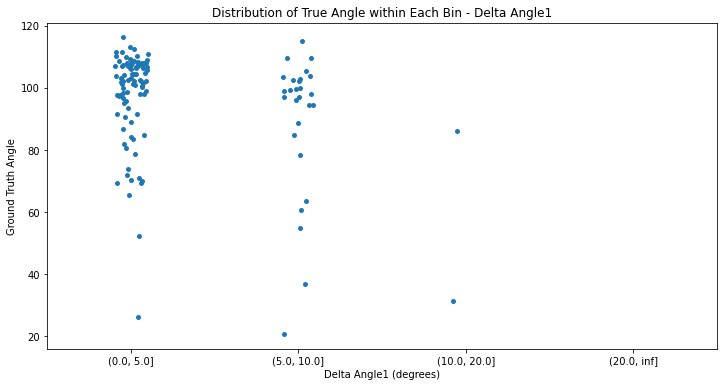

File: 341649.jpeg


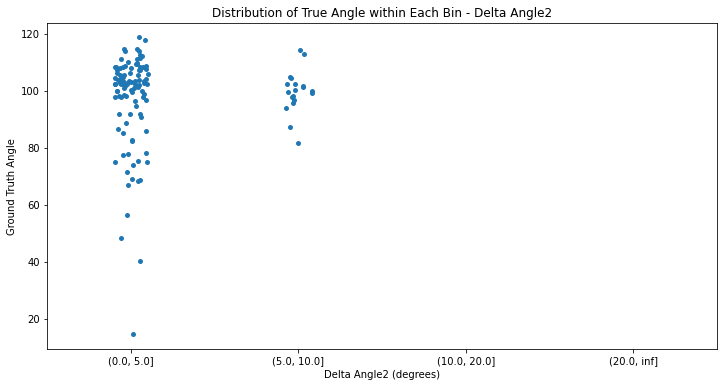

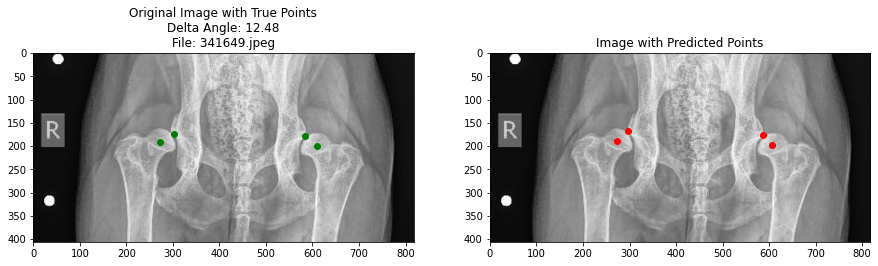

File: 360391.jpeg


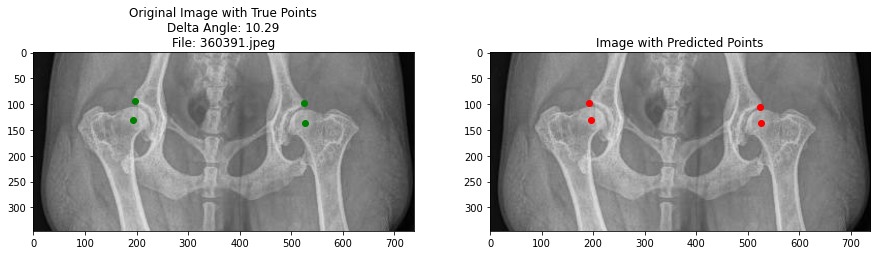

In [28]:
evaluate_df(df2)

In [19]:
def save_predictions_to_mat(df, output_dir):
    for index, row in df.iterrows():
        
        image_file_name = os.path.splitext(os.path.basename(row['Image Path']))[0]
        
        
        four_points = np.array([
           
            [row['Pred Center1 X'], row['Pred Center1 Y']],
            [row['Pred Center2 X'], row['Pred Center2 Y']],
            [row['Pred Left Head X'], row['Pred Left Head Y']],
            [row['Pred Right Head X'], row['Pred Right Head Y']],
            [row['Pred Radius1'], row['Pred Radius2']]
        ])
        
        
        angles = np.array([[row['Pred Angle1'], row['Pred Angle2']]])
        
        
        mat_content = {
            '__header__': b'MATLAB 5.0 MAT-file, Platform: MACI64, Created on: ' + bytes(pd.Timestamp.now().strftime('%Y-%m-%d %H:%M:%S'), 'utf-8'),
            '__version__': '1.0',
            '__globals__': [],
            'Four_points': four_points,
            'Angles': angles
        }
        
        
        file_name = f"{image_file_name}.mat"
        file_path = os.path.join(output_dir, file_name)
        
        
        scipy.io.savemat(file_path, mat_content)
        print(f"Saved predictions to {file_path}")


#output_dir = '/home/featurize/work/Result/Predict'
#save_predictions_to_mat(df, output_dir)

In [20]:
def predict_optimize_image_only(image_path, detector, pose_estimator, conf_thres_center_range, conf_thres_head_range):
    image = imread(image_path)
    
    best_df = None
    ###
    init_default_scope(detector.cfg.get('default_scope', 'mmdet'))
    
    detect_result_all = inference_detector(detector, image_path)
    pred_instance_all = detect_result_all.pred_instances.cpu().numpy()
    bboxes_all = np.concatenate((pred_instance_all.bboxes, pred_instance_all.scores[:, None]), axis=1)           
    
    for conf_thres_center in conf_thres_center_range:
        for conf_thres_head in conf_thres_head_range:
            init_default_scope(detector.cfg.get('default_scope', 'mmdet'))

            # Center detection
            bboxes_center = bboxes_all[np.logical_and(pred_instance_all.labels == 1, pred_instance_all.scores > conf_thres_center)]
            bboxes_center = bboxes_all[np.logical_and(pred_instance_all.labels == 1, pred_instance_all.scores > conf_thres_center)]
            bboxes_center = bboxes_center[nms(bboxes_center, 0.3)][:, :4].astype('int')

            centers_pred = []
            if len(bboxes_center) > 0:
                pose_results_center = inference_topdown(pose_estimator, image_path, bboxes_center)
                try:
                    data_samples_center = merge_data_samples(pose_results_center)
                    centers_pred = data_samples_center.pred_instances.keypoints.astype('int')
                except ValueError as e:
                    print(f'Error merging data samples: {e}')

            # Head detection
            bboxes_head = bboxes_all[np.logical_and(pred_instance_all.labels == 0, pred_instance_all.scores > conf_thres_head)]
            bboxes_head = bboxes_all[np.logical_and(pred_instance_all.labels == 0, pred_instance_all.scores > conf_thres_head)]
            bboxes_head = bboxes_head[nms(bboxes_head, 0.3)][:, :4].astype('int')

            heads_pred = []
            if len(bboxes_head) > 0:
                pose_results_head = inference_topdown(pose_estimator, image_path, bboxes_head)
                try:
                    data_samples_head = merge_data_samples(pose_results_head)
                    heads_pred = data_samples_head.pred_instances.keypoints.astype('int')
                except ValueError as e:
                    print(f'Error merging data samples: {e}')
###
    
            # Initialize DataFrame with predicted values
            df = pd.DataFrame({
                'Image Path': [image_path],
                'Pred Left Head X': [np.nan],
                'Pred Left Head Y': [np.nan],
                'Pred Right Head X': [np.nan],
                'Pred Right Head Y': [np.nan],
                'Pred Center1 X': [np.nan],
                'Pred Center1 Y': [np.nan],
                'Pred Center2 X': [np.nan],
                'Pred Center2 Y': [np.nan],
                'Pred Radius1': [np.nan],
                'Pred Radius2': [np.nan],
                'Pred Angle1': [np.nan],
                'Pred Angle2': [np.nan]
            })

            # Update DataFrame with predicted values if predictions are available
            if len(centers_pred) == 2 and len(heads_pred) == 2:
                # 将预测的点按照x坐标进行排序，确保左边的为left，右边的为right
                centers_pred = sorted(centers_pred, key=lambda p: p[0, 0])
                heads_pred = sorted(heads_pred, key=lambda p: p[0, 0])

                predicted_radius1 = max(bboxes_center[0][2] - bboxes_center[0][0], bboxes_center[0][3] - bboxes_center[0][1]) // 2
                predicted_radius2 = max(bboxes_center[1][2] - bboxes_center[1][0], bboxes_center[1][3] - bboxes_center[1][1]) // 2
                predicted_angle1 = calculate_angle(centers_pred[0][0], heads_pred[0][0], centers_pred[1][0])
                predicted_angle2 = calculate_angle(centers_pred[1][0], heads_pred[1][0], centers_pred[0][0])

                pred_left_head = heads_pred[0][0]
                pred_right_head = heads_pred[1][0]
                pred_center1 = centers_pred[0][0]
                pred_center2 = centers_pred[1][0]

                df.loc[0, 'Pred Left Head X'] = pred_left_head[0]
                df.loc[0, 'Pred Left Head Y'] = pred_left_head[1]
                df.loc[0, 'Pred Right Head X'] = pred_right_head[0]
                df.loc[0, 'Pred Right Head Y'] = pred_right_head[1]
                df.loc[0, 'Pred Center1 X'] = pred_center1[0]
                df.loc[0, 'Pred Center1 Y'] = pred_center1[1]
                df.loc[0, 'Pred Center2 X'] = pred_center2[0]
                df.loc[0, 'Pred Center2 Y'] = pred_center2[1]
                df.loc[0, 'Pred Radius1'] = predicted_radius1
                df.loc[0, 'Pred Radius2'] = predicted_radius2
                df.loc[0, 'Pred Angle1'] = predicted_angle1
                df.loc[0, 'Pred Angle2'] = predicted_angle2

                best_df = df
                break  

    return best_df

def process_images_only_and_save(image_dir, detector, pose_estimator, conf_thres_center_range, conf_thres_head_range, output_dir):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    all_dfs = []
    for image_file in os.listdir(image_dir):
        image_path = os.path.join(image_dir, image_file)
        if image_path.lower().endswith(('.jpg', '.jpeg', '.png')):
            df = predict_optimize_image_only(image_path, detector, pose_estimator, conf_thres_center_range, conf_thres_head_range)
            if df is not None:
                all_dfs.append(df)

    if all_dfs:
        final_df = pd.concat(all_dfs, ignore_index=True)
        #output_path = os.path.join(output_dir, 'predictions_without_gt.csv')
        #final_df.to_csv(output_path, index=False)
    return final_df

In [ ]:
# read unlabeled dataset
image_dir = '/home/featurize/work/Dataset2/data/July_2024'
conf_thres_center_range = np.arange(0.3, 0.5, 0.05)
conf_thres_head_range = np.arange(0.3, 0.5, 0.05)
output_dir = '/home/featurize/work/Result'

df3=process_images_only_and_save(image_dir, detector, pose_estimator, conf_thres_center_range, conf_thres_head_range, output_dir)

In [28]:
image_dir = '/home/featurize/work/Dataset2/hip_generated'
conf_thres_center_range = np.arange(0.3, 0.5, 0.05)
conf_thres_head_range = np.arange(0.3, 0.5, 0.05)
output_dir = '/home/featurize/work/Result'

df4=process_images_only_and_save(image_dir, detector, pose_estimator, conf_thres_center_range, conf_thres_head_range, output_dir)

In [31]:
output_dir = '/home/featurize/work/Result/Predict'
save_predictions_to_mat(df4, output_dir)

Saved predictions to /home/featurize/work/Result/Predict/dog_hip_51_5.mat
Saved predictions to /home/featurize/work/Result/Predict/dog_hip_117_19.mat
Saved predictions to /home/featurize/work/Result/Predict/dog_hip_268_6.mat
Saved predictions to /home/featurize/work/Result/Predict/dog_hip_68_3.mat
Saved predictions to /home/featurize/work/Result/Predict/dog_hip_63_7.mat
Saved predictions to /home/featurize/work/Result/Predict/dog_hip_101_17.mat
Saved predictions to /home/featurize/work/Result/Predict/dog_hip_135_13.mat
Saved predictions to /home/featurize/work/Result/Predict/dog_hip_35_1.mat
Saved predictions to /home/featurize/work/Result/Predict/dog_hip_132_18.mat
Saved predictions to /home/featurize/work/Result/Predict/dog_hip_40_14.mat
Saved predictions to /home/featurize/work/Result/Predict/dog_hip_111_4.mat
Saved predictions to /home/featurize/work/Result/Predict/dog_hip_388_14.mat
Saved predictions to /home/featurize/work/Result/Predict/dog_hip_128_2.mat
Saved predictions to /ho

In [20]:
image_dir = '/home/featurize/work/Dataset2/Tanay_new/Images'
conf_thres_center_range = np.arange(0.3, 0.5, 0.05)
conf_thres_head_range = np.arange(0.3, 0.5, 0.05)
output_dir = '/home/featurize/work/Dataset2/Tanay_new/Predict'

df5=process_images_only_and_save(image_dir, detector, pose_estimator, conf_thres_center_range, conf_thres_head_range, output_dir)

08/06 08:47:32 - mmengine - WARNING - The current default scope "mmpose" is not "mmdet", `init_default_scope` will force set the currentdefault scope to "mmdet".
08/06 08:47:33 - mmengine - WARNING - The current default scope "mmdet" is not "mmpose", `init_default_scope` will force set the currentdefault scope to "mmpose".


In [21]:
output_dir = '/home/featurize/work/Dataset2/Tanay_new/Predict'
save_predictions_to_mat(df5, output_dir)

Saved predictions to /home/featurize/work/Dataset2/Tanay_new/Predict/1764.mat
Saved predictions to /home/featurize/work/Dataset2/Tanay_new/Predict/1305.mat
Saved predictions to /home/featurize/work/Dataset2/Tanay_new/Predict/1473.mat
Saved predictions to /home/featurize/work/Dataset2/Tanay_new/Predict/2107.mat
Saved predictions to /home/featurize/work/Dataset2/Tanay_new/Predict/1012.mat
Saved predictions to /home/featurize/work/Dataset2/Tanay_new/Predict/1959.mat
Saved predictions to /home/featurize/work/Dataset2/Tanay_new/Predict/25.mat
Saved predictions to /home/featurize/work/Dataset2/Tanay_new/Predict/866.mat
Saved predictions to /home/featurize/work/Dataset2/Tanay_new/Predict/414.mat
Saved predictions to /home/featurize/work/Dataset2/Tanay_new/Predict/362.mat
Saved predictions to /home/featurize/work/Dataset2/Tanay_new/Predict/703.mat
Saved predictions to /home/featurize/work/Dataset2/Tanay_new/Predict/1988.mat
Saved predictions to /home/featurize/work/Dataset2/Tanay_new/Predict/9

In [19]:
image_dir = '/home/featurize/data/Images'
conf_thres_center_range = np.arange(0.3, 0.5, 0.05)
conf_thres_head_range = np.arange(0.3, 0.5, 0.05)
output_dir = '/home/featurize/data/Predict'

df6=process_images_only_and_save(image_dir, detector, pose_estimator, conf_thres_center_range, conf_thres_head_range, output_dir)

In [20]:
output_dir = '/home/featurize/data/Predict'
save_predictions_to_mat(df6, output_dir)

Saved predictions to /home/featurize/data/Predict/8845.mat
Saved predictions to /home/featurize/data/Predict/4455.mat
Saved predictions to /home/featurize/data/Predict/5809.mat
Saved predictions to /home/featurize/data/Predict/9035.mat
Saved predictions to /home/featurize/data/Predict/9605.mat
Saved predictions to /home/featurize/data/Predict/4218.mat
Saved predictions to /home/featurize/data/Predict/9492.mat
Saved predictions to /home/featurize/data/Predict/2307.mat
Saved predictions to /home/featurize/data/Predict/4866.mat
Saved predictions to /home/featurize/data/Predict/3719.mat
Saved predictions to /home/featurize/data/Predict/5797.mat
Saved predictions to /home/featurize/data/Predict/2949.mat
Saved predictions to /home/featurize/data/Predict/2341.mat
Saved predictions to /home/featurize/data/Predict/4468.mat
Saved predictions to /home/featurize/data/Predict/8134.mat
Saved predictions to /home/featurize/data/Predict/2263.mat
Saved predictions to /home/featurize/data/Predict/5135.m

In [21]:
# read unlabeled dataset
image_dir = '/home/featurize/data/filtered'
conf_thres_center_range = np.arange(0.3, 0.5, 0.05)
conf_thres_head_range = np.arange(0.3, 0.5, 0.05)
output_dir = '/home/featurize/work/Result'

df3=process_images_only_and_save(image_dir, detector, pose_estimator, conf_thres_center_range, conf_thres_head_range, output_dir)

In [23]:
output_dir = '/home/featurize/data/Predict'
save_predictions_to_mat(df3, output_dir)

Saved predictions to /home/featurize/data/Predict/dog_hip_390_17.mat
Saved predictions to /home/featurize/data/Predict/dog_hip_337_10.mat
Saved predictions to /home/featurize/data/Predict/dog_hip_433_10.mat
Saved predictions to /home/featurize/data/Predict/dog_hip_298_7.mat
Saved predictions to /home/featurize/data/Predict/dog_hip_203_8.mat
Saved predictions to /home/featurize/data/Predict/dog_hip_38_3.mat
Saved predictions to /home/featurize/data/Predict/dog_hip_195_15.mat
Saved predictions to /home/featurize/data/Predict/dog_hip_376_6.mat
Saved predictions to /home/featurize/data/Predict/dog_hip_205_7.mat
Saved predictions to /home/featurize/data/Predict/dog_hip_73_18.mat
Saved predictions to /home/featurize/data/Predict/dog_hip_120_15.mat
Saved predictions to /home/featurize/data/Predict/dog_hip_380_14.mat
Saved predictions to /home/featurize/data/Predict/dog_hip_72_9.mat
Saved predictions to /home/featurize/data/Predict/dog_hip_447_16.mat
Saved predictions to /home/featurize/data/P